# **Ware House**-**Robot**

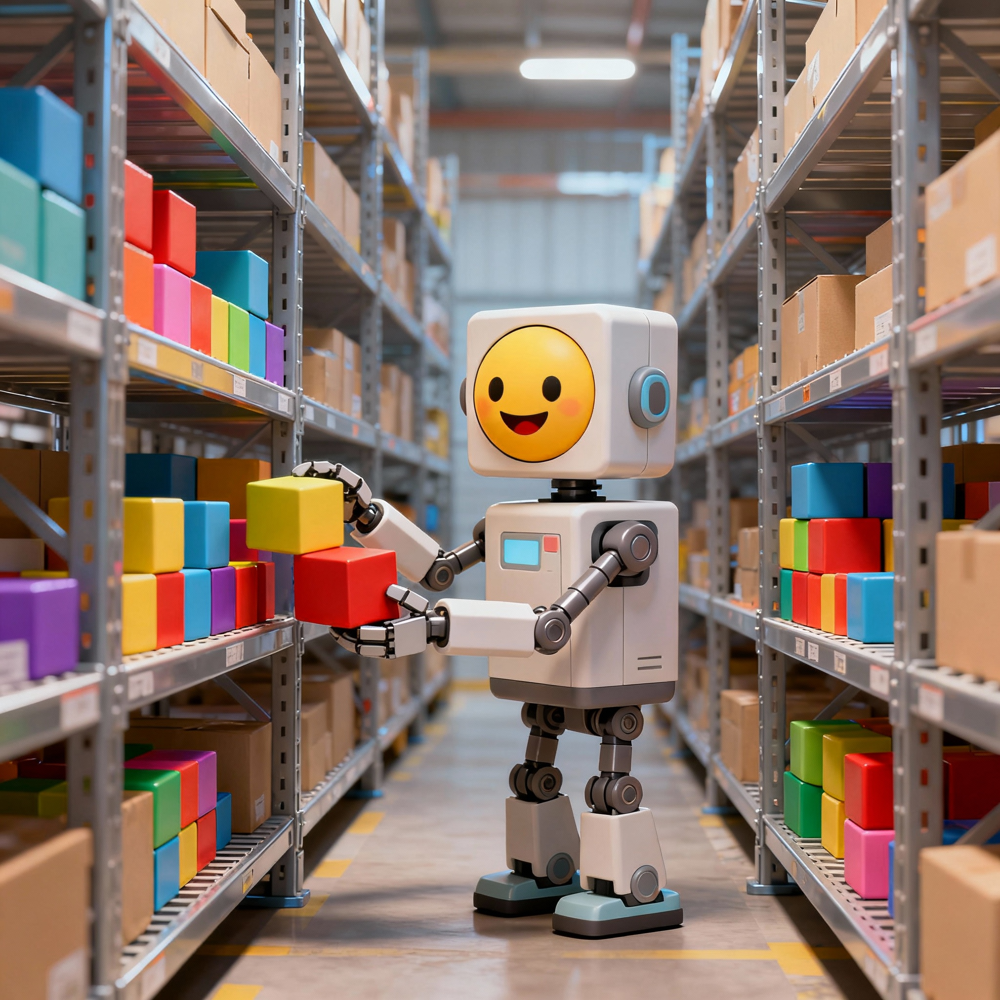





### Nehemiah Clark
### Parimala Ravali Mukkavilli

### Almagro Pedro Barrantes
### Huimei Zheng


----------

## Introduction



---



This project focuses on building a complete warehouse robot automation system using Python and Matplotlib. It began with simple simulations of a single robot navigating a 3D environment, picking up colored cubes, and placing them on corresponding shelves. Gradually, the system evolved into handling multi-robot coordination, where multiple robots worked together to pick and place boxes simultaneously without collisions.

Next, we implemented A* pathfinding algorithms to enable intelligent navigation, allowing robots to find the shortest and safest paths while avoiding obstacles placed between shelves and trucks. The project then advanced to more realistic warehouse operations, where robots were programmed to load and unload trucks, efficiently transporting goods between the warehouse and vehicle.

Throughout the process, the simulations included charging dock behavior, showing robots returning to their base stations after completing deliveries. Each stage was visualized in an interactive 3D environment using emoji-based representations for robots, trucks, shelves, and batteries, making the animations engaging and easy to interpret.

From start to finish, this project demonstrates the key principles of robot motion planning, task scheduling, multi-agent coordination, and autonomous logistics, offering a practical and visually rich representation of how intelligent robots operate in modern automated warehouses.

Table Of Contents


---



[1] Introduction

[2] Installations

[3] Imports

[4] Install and Load Emojis

[5] Matplotlib libraries check

[6] Defining necessary components

[7] Multi-Robot and Box Initialization Setup

[8] Multi-agent delivery system transform

[9] Adding obstacle’s

[10] Multi-Robot Simulation with Obstacles, Cube Carrying, and Charging Dock

[11] Color-based box selection

[12] Single-Robot Warehouse Automation Simulation

[13] Multi-Robot & Multi-boxes

[14] Obstacle-Aware Truck Loading and Unloading Simulation

[15] Loading scenario

[16] Unloading scenario

[17] unloading Adding obstacles

[18] loading adding obstacle

[19] Conclusion

# **Milestone 1**

## Installations

Installs a font that supports color emojis on colab. After running this cell, the system (or notebook environment) will be able to display emojis properly, especially in plots, charts, or text outputs that rely on emoji rendering.




In [ ]:
# Cell 1     Install a font that supports emojis
!apt-get update
!apt-get install -y fonts-noto-color-emoji
!sudo fc-cache -fv


Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:2 https://cli.github.com/packages stable InRelease [3,917 B]
Hit:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:6 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:7 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:11 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get:12 https://r2u.stat.illinois.edu/ubuntu jammy/main all Packages [9,373 kB]
Get:13 http://security.ubuntu.com/ubuntu jammy-security/universe amd64 Packages [1,287 kB]
Get:14

# Imports

Loads all the necessary libraries for visualization, interactivity, image handling, and algorithmic logic. This cell sets the stage for:

 - 3D plotting with emoji or image annotations
 - Interactive widgets
 - Custom image generation
 - Algorithmic logic (e.g., pathfinding or animation)

To make it ready for visual storytelling, simulation, or interactive demos.

In [ ]:
#Cell 2

from google.colab import output
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import display
import time
import ipywidgets as widgets
from IPython.display import clear_output
import numpy as np # Keep one import
import random # Keep one import
from IPython.display import display, clear_output
from PIL import Image, ImageDraw, ImageFont
from mpl_toolkits.mplot3d import proj3d
from matplotlib.offsetbox import OffsetImage, AnnotationBbox # Ensure AnnotationBbox is imported
import random, math, time, urllib.request
from collections import deque
from heapq import heappush, heappop
import matplotlib.image as mpimg
import matplotlib.font_manager as fm
from PIL import Image, ImageDraw, ImageFont
import random, math, time, urllib.request
from IPython.display import clear_output, display







## Install and Load Emojis

To render emojis as images using a Noto Color Emoji, then display them using matplotlib. So we can see a crisp white canvas with a robot emoji 🤖 and a battery 🔋 rendered in full color — due to the Noto Color Emoji font and Pillow’s support for embedded color glyphs.

Emoji font path: ['/usr/share/fonts/truetype/noto/NotoColorEmoji.ttf']


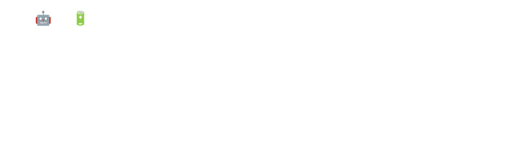

In [ ]:
# STEP 1: (Optional) Rebuild matplotlib’s font cache
# fm.fontManager.clear()
# fm.findSystemFonts(fontpaths=None, fontext='ttf')

# STEP 2: Check if Noto Color Emoji is available
emoji_fonts = [f for f in fm.findSystemFonts() if "NotoColorEmoji" in f]
print("Emoji font path:", emoji_fonts)

# STEP 3: Load Emoji Font
font = ImageFont.truetype("/usr/share/fonts/truetype/noto/NotoColorEmoji.ttf", 109)

# STEP 4: Create Image Canvas (White Background)
img = Image.new("RGB", (4000, 1000), "white")
draw = ImageDraw.Draw(img)

# STEP 5: Draw Robot Emoji
draw.text((200, 10), "🤖", font=font, embedded_color=True)

# STEP 6: Draw Charger Emoji (🔋)
draw.text((500, 10), "🔋", font=font, embedded_color=True)   # Charger plug
# OR
# draw.text((500, 10), "🔋", font=font, embedded_color=True)  # Battery

# STEP 7: Display Image
plt.imshow(img)
plt.axis("off")
plt.show()


## Matplotlib libraries check

This step is a robust import-checking routine — it verifies the availability of key Matplotlib components used for advanced annotation and styling. It's to confirm that specific modules are available before using them, especially in environments like Google Colab or custom Python setups where some packages might be missing or outdated.

Using try-except for imports is a smart way to:

 - Avoid runtime crashes in dynamic environments.
 - Enable fallback logic or conditional rendering.
 - Provide clear feedback for missing dependencies.

In [ ]:

try:
    from matplotlib.offsetbox import AnnotationBbox
    print("AnnotationBbox found in matplotlib.offsetbox")
except ImportError:
    print("AnnotationBbox not found in matplotlib.offsetbox")

try:
    from matplotlib.offsetbox import AnnotationBbox as AB
    print("AnnotationBbox found in matplotlib.offsetbox with alias")
except ImportError:
    print("AnnotationBbox not found in matplotlib.offsetbox with alias")

try:
    from matplotlib.patches import FancyBboxPatch
    print("FancyBboxPatch found in matplotlib.patches (related)")
except ImportError:
    print("FancyBboxPatch not found in matplotlib.patches")

# Add other potential locations if known
# try:
#     from some_other_module import AnnotationBbox
#     print("AnnotationBbox found in some_other_module")
# except ImportError:
#     print("AnnotationBbox not found in some_other_module")

AnnotationBbox found in matplotlib.offsetbox
AnnotationBbox found in matplotlib.offsetbox with alias
FancyBboxPatch found in matplotlib.patches (related)


## Defining necessary components

This is the integration of 3D visualization, emoji rendering, and interactive widgets — a modular simulation framework with real-time updates.

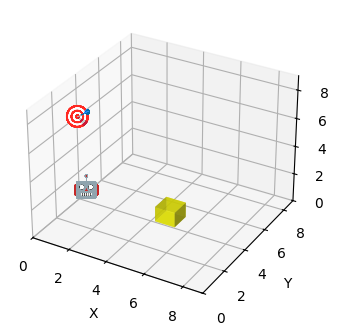

In [ ]:
#Cell 4

# --- Box helper function ----
def draw_cube(ax, position, color="yellow", size=1):
    """Draw a cube at a given position (x,y,z) with the given color."""
    x, y, z = position
    r = np.array([0, size])

    # Bottom face
    X, Y = np.meshgrid(r, r)
    ax.plot_surface(X + x, Y + y, np.full_like(X, z), color=color, alpha=0.7)
    # Top face
    ax.plot_surface(X + x, Y + y, np.full_like(X, z + size), color=color, alpha=0.7)
    # Front face
    X, Z = np.meshgrid(r, r)
    ax.plot_surface(X + x, np.full_like(X, y), Z + z, color=color, alpha=0.7)
    # Back face
    ax.plot_surface(X + x, np.full_like(X, y + size), Z + z, color=color, alpha=0.7)
    # Left face
    Y, Z = np.meshgrid(r, r)
    ax.plot_surface(np.full_like(Y, x), Y + y, Z + z, color=color, alpha=0.7)
    # Right face
    Y, Z = np.meshgrid(r, r)
    ax.plot_surface(np.full_like(Y, x + size), Y + y, Z + z, color=color, alpha=0.7)


# --- Helper to create emoji image ---
def create_emoji_img(emoji="🤖", size=128):
    font = ImageFont.truetype("/usr/share/fonts/truetype/noto/NotoColorEmoji.ttf", 109)
    img = Image.new("RGBA", (size, size), (255, 255, 255, 0))
    draw = ImageDraw.Draw(img)
    draw.text((0, 0), emoji, font=font, embedded_color=True)
    return img


# --- Helper to place emoji in 3D ---
def add_emoji(ax, x, y, z, emoji="🤖", zoom=0.15):
    img = create_emoji_img(emoji)
    imagebox = OffsetImage(img, zoom=zoom)
    ab = AnnotationBbox(imagebox, (0, 0), frameon=False)
    ax.add_artist(ab)

    # Recalculate 3D→2D position every draw
    def update_position(event):
        x2, y2, _ = proj3d.proj_transform(x, y, z, ax.get_proj())
        ab.xybox = (x2, y2)

    fig.canvas.mpl_connect("draw_event", update_position)
    update_position(None)
    return ab


# --- Room setup ---
room_size = 10
initial_robot_pos = [random.randint(0, room_size - 1) for _ in range(3)]
initial_box_pos = [random.randint(0, room_size - 1) for _ in range(3)]
initial_goal = [random.randint(0, room_size - 1) for _ in range(3)]

# State variables
pos = list(initial_robot_pos)
box_pos = list(initial_box_pos)
goal = list(initial_goal)
robot_history = [tuple(pos)]
box_history = [tuple(box_pos)]
robot_state = "empty-handed"

# --- Plot setup ---
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
plt.subplots_adjust(bottom=0.25)


# --- Update plot ---
def update_plot(robot_pos, box_pos, robot_history, box_history, goal_pos):
    ax.clear()

    # Trails
    if robot_history:
        hx, hy, hz = zip(*robot_history)
        ax.plot(hx, hy, hz, color='blue', linestyle='--', linewidth=1)
    if box_history:
        bx, by, bz = zip(*box_history)
        ax.plot(bx, by, bz, color='orange', linestyle='--', linewidth=1)

    # Draw robot, box, goal
    add_emoji(ax, *robot_pos, emoji="🤖", zoom=0.15)

    cube_color = "yellow"
    if robot_state == "carrying_to_goal":
        cube_color = "green"
    elif robot_state == "returning_to_start":
        cube_color = "red"
    draw_cube(ax, box_pos, color=cube_color, size=1)

    add_emoji(ax, *goal_pos, emoji="🎯", zoom=0.15)

    ax.set_xlim(0, room_size-1)
    ax.set_ylim(0, room_size-1)
    ax.set_zlim(0, room_size-1)
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    fig.canvas.draw_idle()


# --- Widgets ---
robot_x_input = widgets.IntText(value=initial_robot_pos[0], description='Robot X:')
robot_y_input = widgets.IntText(value=initial_robot_pos[1], description='Robot Y:')
robot_z_input = widgets.IntText(value=initial_robot_pos[2], description='Robot Z:')

box_x_input = widgets.IntText(value=initial_box_pos[0], description='Box X:')
box_y_input = widgets.IntText(value=initial_box_pos[1], description='Box Y:')
box_z_input = widgets.IntText(value=initial_box_pos[2], description='Box Z:')

goal_x_input = widgets.IntText(value=initial_goal[0], description='Goal X:')
goal_y_input = widgets.IntText(value=initial_goal[1], description='Goal Y:')
goal_z_input = widgets.IntText(value=initial_goal[2], description='Goal Z:')

move_button = widgets.Button(description="Move Robot Towards Goal")




# Initial plot
update_plot(pos, box_pos, robot_history, box_history, goal)



## Multi-Robot and Box Initialization Setup

This cell scales up the simulation from a single robot-box-goal setup to a multi-agent 3D environment for testing coordination, pathfinding, or swarm behavior.

It's to initialize a 3D room with:

 - Multiple robots
 - Multiple boxes
 - One shared goal
 - Individual histories and states for each robot-box pair

So now we have a scalable framework for:

 - Multi-agent coordination
 - Trail visualization
 - State-driven behavior
 - Potential pathfinding or collision avoidance

This structure is for animate movement, assign tasks dynamically, or visualize interactions.

In [ ]:
# Cell 5

# Modify room size
room_size = 20

# Number of robots and boxes
num_entities = 4

# Initialize lists for positions, histories, and states for multiple robots and boxes
robot_positions = [[random.randint(0, room_size - 1) for _ in range(3)] for _ in range(num_entities)]
box_positions = [[random.randint(0, room_size - 1) for _ in range(3)] for _ in range(num_entities)]
goal_position = [random.randint(0, room_size - 1) for _ in range(3)]

# Histories for trails (list of lists for each robot/box)
robot_histories = [[tuple(pos)] for pos in robot_positions]
box_histories = [[tuple(pos)] for pos in box_positions]

# Robot states (e.g., "moving_to_box", "carrying_to_goal", "returning_to_start")
robot_states = ["moving_to_box" for _ in range(num_entities)]

# Assignment of boxes to robots (simple one-to-one for now)
box_assignments = list(range(num_entities)) # Robot i is assigned to box i

# Movement data for tracking (list of lists for each robot)
movement_data = [[] for _ in range(num_entities)]

print(f"Room size set to: {room_size}x{room_size}x{room_size}")
print(f"Initialized {num_entities} robots, {num_entities} boxes, and 1 goal.")
print("Robot initial positions:", robot_positions)
print("Box initial positions:", box_positions)
print("Goal position:", goal_position)

Room size set to: 20x20x20
Initialized 4 robots, 4 boxes, and 1 goal.
Robot initial positions: [[5, 12, 1], [1, 7, 2], [12, 0, 3], [14, 2, 17]]
Box initial positions: [[4, 9, 11], [9, 9, 12], [2, 17, 5], [6, 16, 8]]
Goal position: [12, 4, 1]


## Multi-agent delivery system transform

Transforms the emoji-enhanced 3D simulation into a full-fledged multi-agent delivery system with dynamic assignment, movement logic, and real-time visualization.

Box assignments (robot_index -> box_index): [(0, 2), (1, 0), (2, 3), (3, 1)]


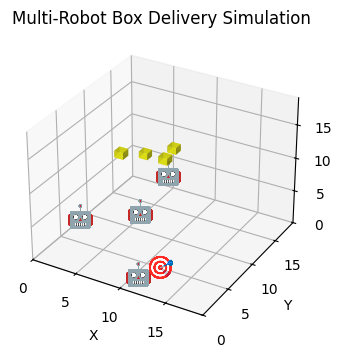

In [ ]:
# Cell 6

# Function to find the closest box for each robot
def find_closest_box_assignment(robot_positions, box_positions):
    """
    Assigns each robot to the closest available box.
    Returns a list of box indices, where index i is the box assigned to robot i.
    """
    num_robots = len(robot_positions)
    num_boxes = len(box_positions)
    assignment = [-1] * num_robots  # Initialize assignments
    available_boxes = list(range(num_boxes)) # Keep track of available boxes

    # Calculate distances between each robot and each box
    distances = []
    for i in range(num_robots):
        robot_dist = []
        for j in range(num_boxes):
            distance = math.sqrt(
                (robot_positions[i][0] - box_positions[j][0])**2 +
                (robot_positions[i][1] - box_positions[j][1])**2 +
                (robot_positions[i][2] - box_positions[j][2])**2
            )
            robot_dist.append((distance, i, j)) # (distance, robot_index, box_index)
        distances.extend(robot_dist)

    # Sort distances and assign boxes to the closest robot first
    distances.sort()

    assigned_boxes_count = 0
    for dist, robot_idx, box_idx in distances:
        if assignment[robot_idx] == -1 and box_idx in available_boxes:
            assignment[robot_idx] = box_idx
            available_boxes.remove(box_idx)
            assigned_boxes_count += 1
            if assigned_boxes_count == num_robots:
                break # All robots assigned

    return assignment

# Update box assignments based on closest box
box_assignments = find_closest_box_assignment(robot_positions, box_positions)
print("Box assignments (robot_index -> box_index):", list(enumerate(box_assignments)))


# --- Simulation Logic for Multiple Robots ---
def move_robots_simulation_step():
    global robot_positions, box_positions, goal_position, robot_histories, box_histories, room_size, robot_states, movement_data, box_assignments

    all_robots_finished = True

    # Record current positions and time for all robots
    current_time = time.time()
    for i in range(num_entities):
        movement_data[i].append({
            "time": current_time,
            "robot_pos": tuple(robot_positions[i]),
            "box_pos": tuple(box_positions[box_assignments[i]]) # Record the position of the assigned box
        })


    for i in range(num_entities):
        # If a robot is not in a finished state, it's not finished with the overall task
        if robot_states[i] != "finished":
             all_robots_finished = False

        # Determine the target based on the robot's state
        target = []
        if robot_states[i] == "moving_to_box":
            # Target is the position of the assigned box
            target = list(box_positions[box_assignments[i]])
        elif robot_states[i] == "carrying_to_goal":
            # Target is the goal position
            target = list(goal_position)
        elif robot_states[i] == "returning_to_start":
            # Target is the origin
            target = [0, 0, 0]
        elif robot_states[i] == "finished":
             continue # Skip movement for finished robots


        # Check if the robot is already at the target
        if robot_positions[i] == target:
            # If at the target, transition to the next state
            if robot_states[i] == "moving_to_box":
                robot_states[i] = "carrying_to_goal"
                print(f"Robot {i} picked up box {box_assignments[i]}!")
            elif robot_states[i] == "carrying_to_goal":
                robot_states[i] = "returning_to_start"
                print(f"Robot {i} dropped off box {box_assignments[i]} at the goal!")
            elif robot_states[i] == "returning_to_start":
                robot_states[i] = "finished"
                print(f"Robot {i} has returned to the start position.")
            continue # No movement needed if already at target


        # Simple movement logic: move one step closer in each dimension
        new_pos = list(robot_positions[i])
        if new_pos[0] < target[0]:
            new_pos[0] += 1
        elif new_pos[0] > target[0]:
            new_pos[0] -= 1

        if new_pos[1] < target[1]:
            new_pos[1] += 1
        elif new_pos[1] > target[1]:
            new_pos[1] -= 1

        if new_pos[2] < target[2]:
            new_pos[2] += 1
        elif new_pos[2] > target[2]:
            new_pos[2] -= 1

        # Check if the new position is valid (within room boundaries)
        def is_valid_pos(p, size):
            return all(0 <= coord < size for coord in p)

        if is_valid_pos(new_pos, room_size):
            robot_positions[i] = new_pos

            # Update assigned box position if robot is carrying it
            if robot_states[i] == "carrying_to_goal":
                box_positions[box_assignments[i]] = list(robot_positions[i]) # Box moves with the robot


            # Only append if position changed
            if not robot_histories[i] or robot_histories[i][-1] != tuple(robot_positions[i]):
                 robot_histories[i].append(tuple(robot_positions[i]))
            # Append box position history regardless of whether it moved (to keep histories aligned)
            box_histories[box_assignments[i]].append(tuple(box_positions[box_assignments[i]]))

        else:
            print(f"Robot {i} tried to move outside room boundaries.")
            # Optionally, handle this error or stop the simulation for this robot


    # Update the plot after all robots have attempted a move
    clear_output(wait=True)
    # Pass all robot and box positions to the update_plot function
    update_plot(robot_positions, box_positions, robot_histories, box_histories, goal_position)
    display(fig) # Use display(fig) to update the plot

    time.sleep(0.1) # Add a small delay

    return all_robots_finished # Return True if all robots are in the "finished" state


# --- Update Plot Function to handle multiple entities ---
def update_plot(robot_positions, box_positions, robot_histories, box_histories, goal_pos):
    ax.clear()

    # Trails for each robot
    for i in range(num_entities):
        if robot_histories[i]:
            hx, hy, hz = zip(*robot_histories[i])
            ax.plot(hx, hy, hz, linestyle='--', linewidth=1, color=f'C{i}') # Use different colors

    # Trails for each box
    for i in range(num_entities):
         if box_histories[i]:
            bx, by, bz = zip(*box_histories[i])
            ax.plot(bx, by, bz, linestyle=':', linewidth=1, color=f'C{i}') # Use different colors

    # Draw robots (as emojis)
    for i in range(num_entities):
         add_emoji(ax, *robot_positions[i], emoji="🤖", zoom=0.15)


    # Draw boxes (as cubes) - Use box_positions list directly
    for i in range(num_entities):
        cube_color = "yellow" # Default color
        # Assign color based on robot state (if a robot is carrying this box)
        robot_idx_carrying_this_box = -1
        for r_idx in range(num_entities):
            if robot_states[r_idx] == "carrying_to_goal" and box_assignments[r_idx] == i:
                 robot_idx_carrying_this_box = r_idx
                 break

        if robot_idx_carrying_this_box != -1:
            # Use a different color if the box is being carried
             cube_color = "green" if robot_states[robot_idx_carrying_this_box] == "carrying_to_goal" else "red" # Example: green when carrying

        draw_cube(ax, box_positions[i], color=cube_color, size=1)


    # Draw goal (as emoji)
    add_emoji(ax, *goal_pos, emoji="🎯", zoom=0.15)


    ax.set_xlim(0, room_size-1)
    ax.set_ylim(0, room_size-1)
    ax.set_zlim(0, room_size-1)
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    ax.set_title("Multi-Robot Box Delivery Simulation")
    fig.canvas.draw_idle()

# --- Run Full Simulation for Multiple Robots ---
def run_full_multi_robot_simulation(b):
    global robot_positions, box_positions, goal_position, robot_histories, box_histories, room_size, robot_states, movement_data, box_assignments

    # Reset history and data for a new simulation run
    robot_positions = [[random.randint(0, room_size - 1) for _ in range(3)] for _ in range(num_entities)]
    box_positions = [[random.randint(0, room_size - 1) for _ in range(3)] for _ in range(num_entities)]
    goal_position = [random.randint(0, room_size - 1) for _ in range(3)]

    robot_histories = [[tuple(pos)] for pos in robot_positions]
    box_histories = [[tuple(pos)] for pos in box_positions]
    movement_data = [[] for _ in range(num_entities)]
    robot_states = ["moving_to_box" for _ in range(num_entities)] # Reset states

    # Re-calculate box assignments at the start of each simulation run
    box_assignments = find_closest_box_assignment(robot_positions, box_positions)
    print("New Box assignments (robot_index -> box_index):", list(enumerate(box_assignments)))


    # Run the simulation steps until all robots are finished
    while not all(state == "finished" for state in robot_states):
        move_robots_simulation_step()

    print("All robots have finished their tasks.")
    # Optionally, display the final state of the plot again
    clear_output(wait=True)
    update_plot(robot_positions, box_positions, robot_histories, box_histories, goal_position)
    display(fig)


# Create a new button to run the multi-robot simulation
run_multi_robot_simulation_button = widgets.Button(description="Run Multi-Robot Simulation")

# Link the button's on_click event to the simulation function
run_multi_robot_simulation_button.on_click(run_full_multi_robot_simulation)


# Display the widgets, including the new button
display(widgets.VBox([
    widgets.Label("Set Positions:"),
    # Note: Widgets for individual robot/box positions are not implemented yet
    widgets.HBox([widgets.Label("Use code cell above to set initial positions")]),
    run_multi_robot_simulation_button,
    # show_graph_button # Keep the show graph button
]))

# Initial plot update with multiple entities
update_plot(robot_positions, box_positions, robot_histories, box_histories, goal_position)
display(fig)

# **Milestone-2**

## Adding obstacle’s

Full multi-agent pathfinding system with obstacle avoidance and emoji-based visualization.

Each robot:

- Determines its target based on state.
- Computes path using A* if needed.
- Moves one step along the path.
- Updates box position if carrying.
- Transitions state upon arrival.

Emoji feedback via print() logs:

- 🤖 picks up box
- 📦 drops box
- ✅ finishes task

update_plot(...)

- Visualizes:
- Robot trails (dashed lines)
- Box trails (not explicitly styled here, but could be added)
- Obstacles (gray cubes)
- Charging dock (🔋 at (-1, -1, 0))
- Robots (🤖)
- Goal (🎯)

Uses fig.canvas.draw_idle() for smooth updates.

run_full_multi_robot_simulation(goal_pos) Initializes:

- Room size
- Robot and box positions
- Histories and states
- Assignments via closest box logic

Runs simulation until all robots are "finished".

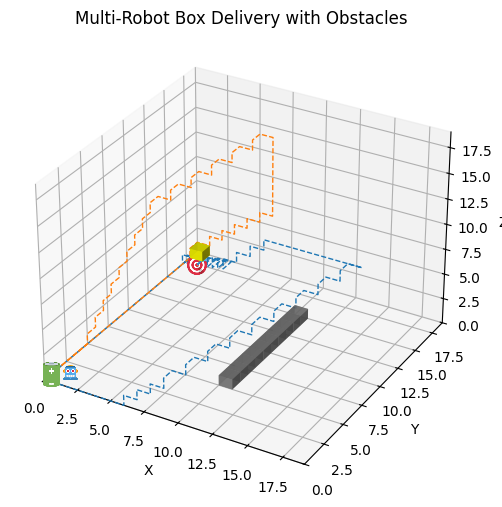

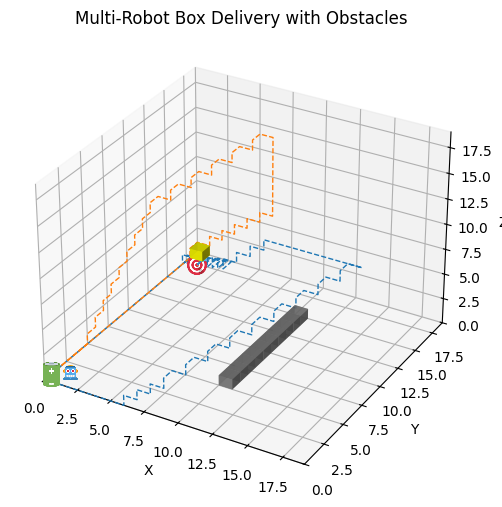

In [ ]:
# --- Multi-Robot Simulation with Obstacles and Emoji Images ---
# --- Download emoji PNGs (only once) ---
urllib.request.urlretrieve("https://github.com/twitter/twemoji/raw/master/assets/72x72/1f916.png", "robot.png")   # 🤖
urllib.request.urlretrieve("https://github.com/twitter/twemoji/raw/master/assets/72x72/1f3af.png", "target.png")  # 🎯
urllib.request.urlretrieve("https://github.com/twitter/twemoji/raw/master/assets/72x72/1f50b.png", "charge.png")   # 🔋

# Load emoji images
robot_img = mpimg.imread("robot.png")
target_img = mpimg.imread("target.png")
charge_img = mpimg.imread("charge.png")

# --- Setup Matplotlib 3D Figure ---
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d")

# --- Helpers to draw objects ---
def draw_cube(ax, position, color="yellow", size=1):
    """Draw a cube at a given position (x,y,z)."""
    x, y, z = position
    r = [0, size]
    X, Y = np.meshgrid(r, r)
    ax.plot_surface(X+x, Y+y, np.full_like(X, z), color=color, alpha=0.7)
    ax.plot_surface(X+x, Y+y, np.full_like(X, z+size), color=color, alpha=0.7)
    X, Z = np.meshgrid(r, r)
    ax.plot_surface(X+x, np.full_like(X, y), Z+z, color=color, alpha=0.7)
    ax.plot_surface(X+x, np.full_like(X, y+size), Z+z, color=color, alpha=0.7)
    Y, Z = np.meshgrid(r, r)
    ax.plot_surface(np.full_like(Y, x), Y+y, Z+z, color=color, alpha=0.7)
    ax.plot_surface(np.full_like(Y, x+size), Y+y, Z+z, color=color, alpha=0.7)

def add_image_marker(ax, x, y, z, img, zoom=0.15):
    """Overlay an image at a 3D coordinate."""
    x2, y2, _ = proj3d.proj_transform(x, y, z, ax.get_proj())
    im = OffsetImage(img, zoom=zoom)
    ab = AnnotationBbox(im, (x2, y2), frameon=False)
    ax.add_artist(ab)

# --- Pathfinding Helpers (A*) ---
def get_neighbors(pos, size, obstacles):
    x, y, z = pos
    directions = [(1,0,0), (-1,0,0), (0,1,0), (0,-1,0), (0,0,1), (0,0,-1)]
    for dx, dy, dz in directions:
        new = (x+dx, y+dy, z+dz)
        if all(0 <= c < size for c in new) and new not in obstacles:
            yield new

def astar(start, goal, size, obstacles):
    open_set = []
    heappush(open_set, (0, start))
    came_from = {}
    g = {start: 0}
    f = {start: math.dist(start, goal)}

    while open_set:
        _, current = heappop(open_set)
        if current == goal:
            path = []
            while current in came_from:
                path.append(current)
                current = came_from[current]
            return path[::-1]

        for neighbor in get_neighbors(current, size, obstacles):
            tentative_g = g[current] + 1
            if tentative_g < g.get(neighbor, float("inf")):
                came_from[neighbor] = current
                g[neighbor] = tentative_g
                f[neighbor] = tentative_g + math.dist(neighbor, goal)
                heappush(open_set, (f[neighbor], neighbor))
    return []

# --- Assign closest box ---
def find_closest_box_assignment(robot_positions, box_positions):
    num_robots = len(robot_positions)
    num_boxes = len(box_positions)
    assignment = [-1] * num_robots
    available_boxes = list(range(num_boxes))
    distances = []
    for i in range(num_robots):
        for j in range(num_boxes):
            d = math.dist(robot_positions[i], box_positions[j])
            distances.append((d, i, j))
    distances.sort()
    for _, ri, bj in distances:
        if assignment[ri] == -1 and bj in available_boxes:
            assignment[ri] = bj
            available_boxes.remove(bj)
    return assignment

# --- Update Plot ---
def update_plot(robot_positions, box_positions, robot_histories, box_histories, goal_pos, obstacles):
    ax.clear()

    # Trails
    for i in range(len(robot_positions)):
        if robot_histories[i]:
            hx, hy, hz = zip(*robot_histories[i])
            ax.plot(hx, hy, hz, linestyle='--', linewidth=1, color=f'C{i}')

    # Boxes
    for i in range(len(box_positions)):
        draw_cube(ax, box_positions[i], color="yellow", size=1)

    # Obstacles (gray cubes in the middle)
    for obs in obstacles:
        draw_cube(ax, obs, color="gray", size=1)


    # Charging Dock 🔋
    charging_pos = (-1, -1, 0)
    add_image_marker(ax, *charging_pos, charge_img, zoom=0.25)

    # Robots (🤖 image)
    for i in range(len(robot_positions)):
        add_image_marker(ax, *robot_positions[i], robot_img, zoom=0.15)

    # Goal (🎯 image)
    add_image_marker(ax, *goal_pos, target_img, zoom=0.2)

    ax.set_xlim(0, room_size-1)
    ax.set_ylim(0, room_size-1)
    ax.set_zlim(0, room_size-1)
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    ax.set_title("Multi-Robot Box Delivery with Obstacles")
    fig.canvas.draw_idle()
    fixed_goal_position = [0, 18, 18]


# --- Simulation Step ---
def move_robots_simulation_step_with_obstacles(goal_pos):
    global robot_positions, robot_states, box_positions, box_assignments, robot_paths, room_size, obstacles, robot_histories, box_histories

    all_finished = True
    for i in range(len(robot_positions)):
        if robot_states[i] == "finished":
            continue
        all_finished = False

        # Determine target
        target = None
        if robot_states[i] == "moving_to_box":
            target = tuple(box_positions[box_assignments[i]])
        elif robot_states[i] == "carrying_to_goal":
            target = tuple(goal_pos)
        elif robot_states[i] == "returning_to_start":
            target = (0, 0, 0)
        elif robot_states[i] == "finished":
             continue

        # Assign path if none or if target changed
        if not robot_paths[i] or (target is not None and tuple(robot_positions[i]) != target and tuple(robot_paths[i])[-1] != target):
            robot_paths[i] = deque(astar(tuple(robot_positions[i]), target, room_size, obstacles))
            if not robot_paths[i]:
                 print(f"🤖 Robot {i} Cannot find path to {target}!")
                 continue


        # Move along path
        if robot_paths[i]:
            next_step = robot_paths[i].popleft()
            robot_positions[i] = list(next_step)
            if robot_states[i] == "carrying_to_goal":
                box_positions[box_assignments[i]] = list(next_step)

            robot_histories[i].append(tuple(robot_positions[i]))
            if robot_states[i] == "carrying_to_goal":
                box_histories[box_assignments[i]].append(tuple(box_positions[box_assignments[i]]))

        # Check arrival
        if tuple(robot_positions[i]) == target:
            if robot_states[i] == "moving_to_box":
                robot_states[i] = "carrying_to_goal"
                print(f"🤖 Robot {i} picked box {box_assignments[i]}")
            elif robot_states[i] == "carrying_to_goal":
                robot_states[i] = "returning_to_start"
                print(f"📦 Robot {i} dropped box {box_assignments[i]} at goal 🎯")
            elif robot_states[i] == "returning_to_start":
                robot_states[i] = "finished"
                print(f"✅ Robot {i} finished.")

    clear_output(wait=True)
    update_plot(robot_positions, box_positions, robot_histories, box_histories, goal_pos, obstacles)
    display(fig)
    time.sleep(0.2)
    return all_finished

# --- Run Simulation ---
def run_full_multi_robot_simulation(goal_pos):
    global robot_positions, box_positions, robot_histories, box_histories
    global robot_states, robot_paths, box_assignments, obstacles, room_size

    room_size = 20
    num_entities = 2

    robot_positions = [[0, 0, 0] for _ in range(num_entities)]
    box_positions = [[random.randint(0, room_size - 1) for _ in range(3)] for _ in range(num_entities)]
    # goal_position = [random.randint(0, room_size - 1) for _ in range(3)] # Removed randomization here

    # wall of obstacles in the middle
    obstacles = {(room_size//2, y, 0) for y in range(5, room_size-5)}

    robot_histories = [[tuple(pos)] for pos in robot_positions]
    box_histories = [[tuple(pos)] for pos in box_positions]
    robot_states = ["moving_to_box" for _ in range(num_entities)]
    robot_paths = [deque() for _ in range(num_entities)]

    box_assignments = find_closest_box_assignment(robot_positions, box_positions)
    print("Assignments:", list(enumerate(box_assignments)))

    while not all(state == "finished" for state in robot_states):
        move_robots_simulation_step_with_obstacles(goal_pos) # Pass goal_pos to the step function

    print("All robots finished.")
    clear_output(wait=True)
    update_plot(robot_positions, box_positions, robot_histories, box_histories, goal_pos, obstacles) # Pass goal_pos to update_plot
    display(fig)

# Run once
# Initialize the fixed goal position outside the simulation function
fixed_goal_position = [0, 18, 0]
run_full_multi_robot_simulation(fixed_goal_position) # Pass the fixed goal position

### Multi-Robot Simulation with Obstacles, Cube Carrying, and Charging Dock

This Python program simulates a **multi-robot warehouse system** where multiple robots work together to pick up boxes, avoid obstacles, deliver them to a target location, and then return to a charging dock. It uses **Matplotlib’s 3D plotting** to visually represent the environment, including robots (🤖), targets (🎯), obstacles, and charging stations (🔋). The program implements an **A* (A-star) pathfinding algorithm** that allows each robot to navigate efficiently around obstacles while finding the shortest path to its assigned cube, the delivery goal, and finally back to the charging area.

Throughout the simulation, each robot’s movement, cube carrying, and task completion are updated step by step in real time using animated visualization. The robots pick up cubes, transport them safely while avoiding collisions, drop them off at the goal location, and then return to recharge, showcasing both **autonomous navigation and coordination**. This simulation demonstrates how intelligent path planning and multi-robot collaboration can be applied to realistic warehouse or delivery systems.


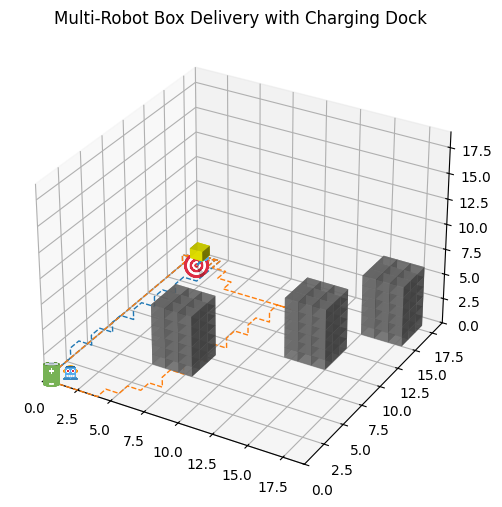

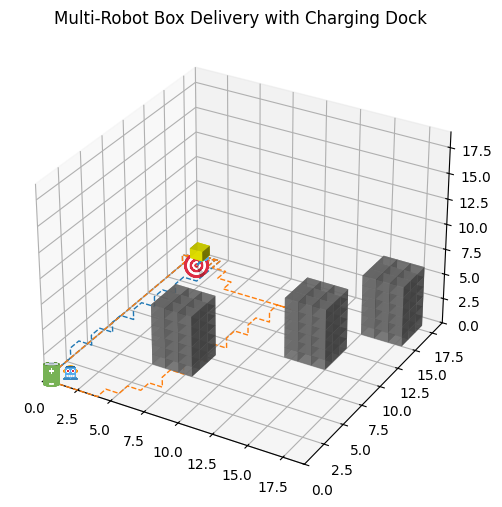

In [ ]:
# --- Multi-Robot Simulation with Obstacles, Cube Carrying, and Charging Dock ---

# --- Download emoji PNGs (only once) ---
urllib.request.urlretrieve("https://github.com/twitter/twemoji/raw/master/assets/72x72/1f916.png", "robot.png")    # 🤖
urllib.request.urlretrieve("https://github.com/twitter/twemoji/raw/master/assets/72x72/1f3af.png", "target.png")   # 🎯
urllib.request.urlretrieve("https://github.com/twitter/twemoji/raw/master/assets/72x72/1f50b.png", "charge.png")   # 🔋

# Load emoji images
robot_img = mpimg.imread("robot.png")
target_img = mpimg.imread("target.png")
charge_img = mpimg.imread("charge.png")

# --- Setup Matplotlib 3D Figure ---
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d")

# --- Helpers ---
def draw_cube(ax, position, color="yellow", size=1):
    x, y, z = position
    r = [0, size]
    X, Y = np.meshgrid(r, r)
    ax.plot_surface(X+x, Y+y, np.full_like(X, z), color=color, alpha=0.7)
    ax.plot_surface(X+x, Y+y, np.full_like(X, z+size), color=color, alpha=0.7)
    X, Z = np.meshgrid(r, r)
    ax.plot_surface(X+x, np.full_like(X, y), Z+z, color=color, alpha=0.7)
    ax.plot_surface(X+x, np.full_like(X, y+size), Z+z, color=color, alpha=0.7)
    Y, Z = np.meshgrid(r, r)
    ax.plot_surface(np.full_like(Y, x), Y+y, Z+z, color=color, alpha=0.7)
    ax.plot_surface(np.full_like(Y, x+size), Y+y, Z+z, color=color, alpha=0.7)

def add_image_marker(ax, x, y, z, img, zoom=0.15):
    x2, y2, _ = proj3d.proj_transform(x, y, z, ax.get_proj())
    im = OffsetImage(img, zoom=zoom)
    ab = AnnotationBbox(im, (x2, y2), frameon=False)
    ax.add_artist(ab)

# --- Pathfinding (A*) ---
def get_neighbors(pos, size, obstacles):
    x, y, z = pos
    directions = [(1,0,0), (-1,0,0), (0,1,0), (0,-1,0), (0,0,1), (0,0,-1)]
    for dx, dy, dz in directions:
        new = (x+dx, y+dy, z+dz)
        if all(0 <= c < size for c in new) and new not in obstacles:
            yield new

def astar(start, goal, size, obstacles):
    open_set = []
    heappush(open_set, (0, start))
    came_from = {}
    g = {start: 0}
    f = {start: math.dist(start, goal)}

    while open_set:
        _, current = heappop(open_set)
        if current == goal:
            path = []
            while current in came_from:
                path.append(current)
                current = came_from[current]
            return path[::-1]

        for neighbor in get_neighbors(current, size, obstacles):
            tentative_g = g[current] + 1
            if tentative_g < g.get(neighbor, float("inf")):
                came_from[neighbor] = current
                g[neighbor] = tentative_g
                f[neighbor] = tentative_g + math.dist(neighbor, goal)
                heappush(open_set, (f[neighbor], neighbor))
    return []

# --- Assign closest box ---
def find_closest_box_assignment(robot_positions, box_positions):
    num_robots = len(robot_positions)
    num_boxes = len(box_positions)
    assignment = [-1] * num_robots
    available_boxes = list(range(num_boxes))
    distances = []
    for i in range(num_robots):
        for j in range(num_boxes):
            d = math.dist(robot_positions[i], box_positions[j])
            distances.append((d, i, j))
    distances.sort()
    for _, ri, bj in distances:
        if assignment[ri] == -1 and bj in available_boxes:
            assignment[ri] = bj
            available_boxes.remove(bj)
    return assignment

# --- Update Plot ---
def update_plot(robot_positions, box_positions, robot_histories, box_histories, goal_pos, obstacles):
    ax.clear()

    # Trails
    for i in range(len(robot_positions)):
        if robot_histories[i]:
            hx, hy, hz = zip(*robot_histories[i])
            ax.plot(hx, hy, hz, linestyle='--', linewidth=1, color=f'C{i}')

    # Boxes 📦
    for i in range(len(box_positions)):
        draw_cube(ax, box_positions[i], color="yellow", size=1)

    # Obstacles
    for obs in obstacles:
        draw_cube(ax, obs, color="gray", size=1)

    # Charging Dock 🔋
    charging_pos = (-1, -1, 0)
    add_image_marker(ax, *charging_pos, charge_img, zoom=0.25)

    # Robots 🤖
    for i in range(len(robot_positions)):
        pos = tuple(robot_positions[i])
        if pos == charging_pos:
            add_image_marker(ax, *pos, charge_img, zoom=0.25)
            add_image_marker(ax, *pos, robot_img, zoom=0.18)
        else:
            add_image_marker(ax, *pos, robot_img, zoom=0.15)

    # Goal 🎯
    add_image_marker(ax, *goal_pos, target_img, zoom=0.25)

    ax.set_xlim(0, room_size-1)
    ax.set_ylim(0, room_size-1)
    ax.set_zlim(0, room_size-1)
    ax.set_title("Multi-Robot Box Delivery with Charging Dock")
    fig.canvas.draw_idle()

# --- Simulation Step ---
def move_robot_step(goal_pos):
    global robot_positions, robot_states, box_positions, robot_assignments, robot_paths, obstacles, robot_histories, box_histories

    all_finished = True
    for i in range(len(robot_positions)):
        if robot_states[i] == "finished":
            continue
        all_finished = False

        if robot_states[i] == "moving_to_box":
            target = tuple(box_positions[robot_assignments[i]])
        elif robot_states[i] == "carrying_to_goal":
            target = tuple(goal_pos)
        elif robot_states[i] == "returning_to_dock":
            target = (0, 0, 0)
        else:
            continue

        if not robot_paths[i] or tuple(robot_paths[i])[-1] != target:
            robot_paths[i] = deque(astar(tuple(robot_positions[i]), target, room_size, obstacles))
            if not robot_paths[i]:
                print(f"🤖 Robot {i} cannot reach {target}!")
                robot_states[i] = "finished"
                continue

        for _ in range(2):  # faster steps
            if robot_paths[i]:
                next_step = robot_paths[i].popleft()
                robot_positions[i] = list(next_step)
                if robot_states[i] == "carrying_to_goal":
                    box_positions[robot_assignments[i]] = list(next_step)

                robot_histories[i].append(tuple(robot_positions[i]))
                if robot_states[i] == "carrying_to_goal":
                    box_histories[robot_assignments[i]].append(tuple(box_positions[robot_assignments[i]]))

        if tuple(robot_positions[i]) == target:
            if robot_states[i] == "moving_to_box":
                robot_states[i] = "carrying_to_goal"
                print(f"🤖 Robot {i} picked cube {robot_assignments[i]}")
            elif robot_states[i] == "carrying_to_goal":
                robot_states[i] = "returning_to_dock"
                print(f"📦 Robot {i} dropped cube {robot_assignments[i]} at goal 🎯")
            elif robot_states[i] == "returning_to_dock":
                robot_states[i] = "finished"
                print(f"✅ Robot {i} back at dock 🔋")

    clear_output(wait=True)
    update_plot(robot_positions, box_positions, robot_histories, box_histories, goal_pos, obstacles)
    display(fig)
    time.sleep(0.05)
    return all_finished

# --- Run Simulation ---
def run_simulation():
    global robot_positions, box_positions, robot_histories, box_histories
    global robot_states, robot_paths, robot_assignments, obstacles, room_size

    room_size = 20
    num_entities = 2  # two robots

    robot_positions = [[0, 0, 0] for _ in range(num_entities)]

    # Obstacles
    def create_obstacle(x, y, width=3, depth=3, height=6):
        return {(x+dx, y+dy, dz)
                for dx in range(width)
                for dy in range(depth)
                for dz in range(height)}

    obstacles = set()
    obstacles.update(create_obstacle(5, 5))
    obstacles.update(create_obstacle(12, 10))
    obstacles.update(create_obstacle(15, 15))

    # Boxes
    box_positions = []
    while len(box_positions) < num_entities:
        pos = [random.randint(0, room_size-1) for _ in range(3)]
        if tuple(pos) not in obstacles:
            box_positions.append(pos)

    # Fixed goal 🎯
    goal_pos = [0, 18, 0]
    while tuple(goal_pos) in obstacles:
        goal_pos = [random.randint(0, room_size-1) for _ in range(3)]

    robot_histories = [[tuple(pos)] for pos in robot_positions]
    box_histories = [[tuple(pos)] for pos in box_positions]
    robot_states = ["moving_to_box" for _ in range(num_entities)]
    robot_paths = [deque() for _ in range(num_entities)]
    robot_assignments = list(range(num_entities))  # assign each robot a cube

    print("Assignments:", list(enumerate(robot_assignments)))
    print("🎯 Goal Position:", goal_pos)

    while not all(state == "finished" for state in robot_states):
        move_robot_step(goal_pos)

    print("All robots finished at dock 🔋")
    clear_output(wait=True)
    update_plot(robot_positions, box_positions, robot_histories, box_histories, goal_pos, obstacles)
    display(fig)

# Run
run_simulation()


## Color-based box selection

### This Enables

- Task differentiation: robots can be assigned based on color-coded priorities.
- User interaction: future widget integration could allow users to select colors dynamically.
- Visual clarity: colored cubes in the plot can reflect assigned colors for intuitive tracking.

In [ ]:
#Cell 7 # colored boxes and selection by color:

# Modify room size
room_size = 20

# Number of robots and boxes
num_entities = 4

# Define possible box colors
box_colors = ["red", "blue", "green", "yellow"]

# Initialize lists for positions, histories, and states for multiple robots and boxes
robot_positions = [[random.randint(0, room_size - 1) for _ in range(3)] for _ in range(num_entities)]
box_positions = [[random.randint(0, room_size - 1) for _ in range(3)] for _ in range(num_entities)]
goal_position = [random.randint(0, room_size - 1) for _ in range(3)]

# Assign colors to boxes randomly (could also fix specific ones)
box_color_assignments = [random.choice(box_colors) for _ in range(num_entities)]

# Histories for trails (list of lists for each robot/box)
robot_histories = [[tuple(pos)] for pos in robot_positions]
box_histories = [[tuple(pos)] for pos in box_positions]

# Robot states (e.g., "moving_to_box", "carrying_to_goal", "returning_to_start")
robot_states = ["idle" for _ in range(num_entities)]

# Assignment of boxes to robots (will be determined based on color request)
box_assignments = [None for _ in range(num_entities)]  # Initially unassigned

# Movement data for tracking (list of lists for each robot)
movement_data = [[] for _ in range(num_entities)]


def assign_box_to_robot_by_color(robot_index, color):
    """Assign the first available box with the given color to the robot."""
    for i, c in enumerate(box_color_assignments):
        if c == color and i not in box_assignments:  # box not already taken
            box_assignments[robot_index] = i
            robot_states[robot_index] = "moving_to_box"
            print(f"Robot {robot_index} assigned to {color} box at {box_positions[i]}")
            return
    print(f"No available {color} box for Robot {robot_index}")


print(f"Room size set to: {room_size}x{room_size}x{room_size}")
print(f"Initialized {num_entities} robots, {num_entities} boxes, and 1 goal.")
print("Robot initial positions:", robot_positions)
print("Box initial positions with colors:", list(zip(box_positions, box_color_assignments)))
print("Goal position:", goal_position)

# Example: Assign robot 0 to a red box if available
assign_box_to_robot_by_color(0, "red")
assign_box_to_robot_by_color(1, "blue")


Room size set to: 20x20x20
Initialized 4 robots, 4 boxes, and 1 goal.
Robot initial positions: [[19, 14, 13], [2, 5, 9], [10, 6, 4], [15, 14, 13]]
Box initial positions with colors: [([8, 19, 18], 'blue'), ([2, 4, 9], 'green'), ([3, 1, 5], 'yellow'), ([17, 7, 10], 'red')]
Goal position: [8, 12, 12]
Robot 0 assigned to red box at [17, 7, 10]
Robot 1 assigned to blue box at [8, 19, 18]


In [ ]:
def add_text_marker(ax, x, y, z, emoji="🤖"):
    # Convert 3D coordinates to 2D projection
    x2, y2, _ = proj3d.proj_transform(x, y, z, ax.get_proj())
    ax.text2D(x2, y2, emoji, fontsize=16, ha="center", va="center")


# --- Setup ---
room_size = 30
num_boxes = 6  # multiple boxes in the room
robot_position = [random.randint(0, room_size - 1) for _ in range(3)]
box_positions = [[random.randint(0, room_size - 1) for _ in range(3)] for _ in range(num_boxes)]
goal_position = [random.randint(0, room_size - 1) for _ in range(3)]

box_colors = ["red", "blue", "green", "yellow"]
box_color_assignments = [random.choice(box_colors) for _ in range(num_boxes)]

robot_history = [tuple(robot_position)]
box_histories = [[tuple(pos)] for pos in box_positions]
robot_state = "idle"
assigned_box = None

# --- Helper: choose a box by user color ---
def assign_box_by_color(robot_pos, box_positions, box_colors, desired_color):
    candidates = [
        (math.dist(robot_pos, box_positions[i]), i)
        for i, c in enumerate(box_colors) if c == desired_color
    ]
    if not candidates:
        print(f"No {desired_color} box available!")
        return None
    _, closest_idx = min(candidates, key=lambda x: x[0])
    print(f"Assigned {desired_color} box {closest_idx} at {box_positions[closest_idx]} to robot")
    return closest_idx

# --- Movement step ---
def move_robot_step():
    global robot_position, robot_state, assigned_box, box_positions

    if robot_state == "idle" or assigned_box is None:
        return True  # nothing to do

    # Decide target
    if robot_state == "moving_to_box":
        target = box_positions[assigned_box]
    elif robot_state == "carrying_to_goal":
        target = goal_position
    elif robot_state == "returning_to_start":
        target = [0, 0, 0]
    else:
        return True

    # Already at target
    if robot_position == target:
        if robot_state == "moving_to_box":
            robot_state = "carrying_to_goal"
            print(f"Robot picked up {box_color_assignments[assigned_box]} box {assigned_box}")
        elif robot_state == "carrying_to_goal":
            robot_state = "returning_to_start"
            print(f"Robot dropped {box_color_assignments[assigned_box]} box {assigned_box} at goal")
        elif robot_state == "returning_to_start":
            robot_state = "finished"
            print("Robot returned to start")
        return False

    # Move closer step-by-step
    new_pos = list(robot_position)
    for dim in range(3):
        if new_pos[dim] < target[dim]:
            new_pos[dim] += 1
        elif new_pos[dim] > target[dim]:
            new_pos[dim] -= 1

    robot_position = new_pos
    if robot_state == "carrying_to_goal":
        box_positions[assigned_box] = list(robot_position)  # box follows robot

    robot_history.append(tuple(robot_position))
    box_histories[assigned_box].append(tuple(box_positions[assigned_box]))
    return False

# --- Run Simulation ---
def run_simulation(desired_color):
    global robot_state, assigned_box, robot_position, robot_history

    # Reset robot
    robot_state = "moving_to_box"
    robot_history = [tuple(robot_position)]

    # Assign a box by color
    assigned_box = assign_box_by_color(robot_position, box_positions, box_color_assignments, desired_color)
    if assigned_box is None:
        return

    # Simulation loop
    while robot_state != "finished":
        finished = move_robot_step()
        clear_output(wait=True)
        print("Robot pos:", robot_position, "| Box pos:", box_positions[assigned_box], "| State:", robot_state)
        time.sleep(0.1)

    print("Simulation finished!")

# --- Example run ---
print("Boxes:", list(enumerate(zip(box_positions, box_color_assignments))))
print("Goal:", goal_position)
run_simulation("red")  # User chooses color here


Robot pos: [0, 0, 0] | Box pos: [21, 27, 22] | State: finished
Simulation finished!


## Single-Robot Warehouse Automation Simulation


This Python program simulates a single robot performing warehouse automation tasks — picking up boxes, placing them on matching-color shelves, and returning to its charging dock. It uses Matplotlib’s 3D plotting to visualize the robot, shelves, boxes, and charging station, creating a dynamic step-by-step animation. The robot uses the A pathfinding algorithm* to plan efficient routes across the warehouse while ensuring it reaches each target box and corresponding shelf accurately.

During the simulation, the robot starts from its charging position, moves toward each colored box, picks it up, and places it on the correct shelf. After all boxes are successfully delivered, it autonomously returns to the charging station, completing its routine. The program demonstrates the fundamental principles of path planning, environment visualization, and autonomous robot navigation in a simplified warehouse setting.

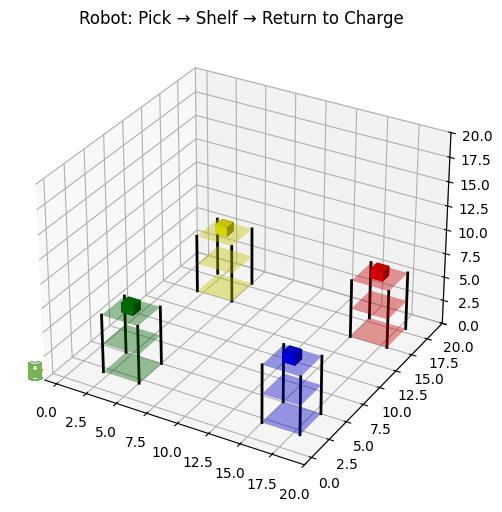

✅ All boxes delivered, robot returned to 🔋 charging


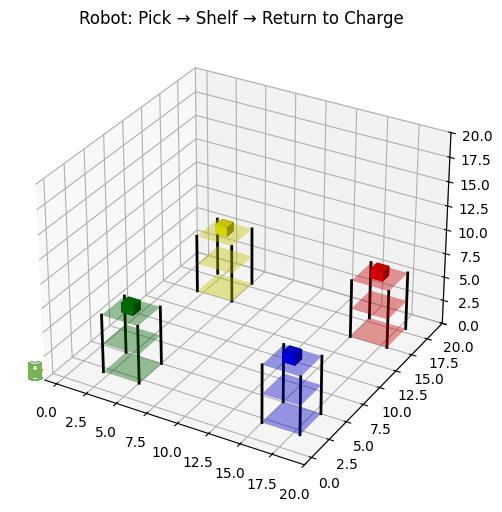

In [ ]:
# --- Download emojis ---
urllib.request.urlretrieve("https://github.com/twitter/twemoji/raw/master/assets/72x72/1f916.png", "robot.png")
urllib.request.urlretrieve("https://github.com/twitter/twemoji/raw/master/assets/72x72/1f50b.png", "charge.png")   # 🔋

robot_img = mpimg.imread("robot.png")
charge_img = mpimg.imread("charge.png")

# --- Setup plot ---
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d")

def draw_shelf(ax, position, color="gray", width=3, depth=3, height=6, levels=3, alpha=0.4):
    """
    Draw a 3D shelf with 4 legs and horizontal plates.
    """
    x, y, z = position
    level_gap = height // (levels - 1)

    # Legs
    leg_coords = [(x, y), (x+width, y), (x, y+depth), (x+width, y+depth)]
    for lx, ly in leg_coords:
        ax.plot([lx, lx], [ly, ly], [z, z+height], color="black", linewidth=2)

    # Horizontal plates
    for i in range(levels):
        z_level = z + i * level_gap
        X, Y = np.meshgrid([0, width], [0, depth])
        ax.plot_surface(X+x, Y+y, np.full_like(X, z_level), color=color, alpha=alpha)

def add_image_marker(ax, x, y, z, img, zoom=0.15):
    x2, y2, _ = proj3d.proj_transform(x, y, z, ax.get_proj())
    im = OffsetImage(img, zoom=zoom)
    ab = AnnotationBbox(im, (x2, y2), frameon=False)
    ax.add_artist(ab)

# --- A* Pathfinding ---
def get_neighbors(pos, size):
    x,y,z = pos
    for dx,dy,dz in [(1,0,0),(-1,0,0),(0,1,0),(0,-1,0)]:
        new=(x+dx,y+dy,z+dz)
        if all(0<=c<size for c in new):
            yield new

def astar(start,goal,size):
    open_set=[]; heappush(open_set,(0,start))
    came_from,g,f={}, {start:0}, {start:math.dist(start,goal)}
    while open_set:
        _,current=heappop(open_set)
        if current==goal:
            path=[]
            while current in came_from:
                path.append(current)
                current=came_from[current]
            return path[::-1]
        for n in get_neighbors(current,size):
            tg=g[current]+1
            if tg<g.get(n,float("inf")):
                came_from[n]=current; g[n]=tg; f[n]=tg+math.dist(n,goal)
                heappush(open_set,(f[n],n))
    return []

# --- Setup ---
room_size=20
start_position=(0,1,0)

shelves={
    "red":(15,15,0),
    "blue":(15,2,0),
    "yellow":(2,15,0),
    "green":(2,2,0)
}

colors=["red","blue","yellow","green"]
box_positions=[]
box_colors=[]
for c in colors:
    pos=[random.randint(6,12),random.randint(6,12),0]
    box_positions.append(pos)
    box_colors.append(c)

delivered=[]

# --- Update Plot ---
def update_plot(robot_pos, carrying=None):
    ax.clear()
    # Draw shelves
    for c,p in shelves.items():
        draw_shelf(ax,p,color=c,width=3,depth=3,height=6,levels=3,alpha=0.4)
    # Remaining boxes
    for i,pos in enumerate(box_positions):
        if i not in delivered and i!=carrying:
            ax.bar3d(pos[0],pos[1],pos[2],1,1,1,color=box_colors[i])
    # Delivered boxes
    for i in delivered:
        color=box_colors[i]; shelf=shelves[color]
        # Place cube ON TOP of shelf
        ax.bar3d(shelf[0]+1,shelf[1]+1,shelf[2]+6,1,1,1,color=color)
    # Carried box
    if carrying is not None and carrying not in delivered:
        ax.bar3d(robot_pos[0],robot_pos[1],robot_pos[2],1,1,1,color=box_colors[carrying])
    # Robot
    add_image_marker(ax,*robot_pos,robot_img,zoom=0.15)
    # Charging station (INSIDE at 0,0,0)
    add_image_marker(ax,*start_position,charge_img,zoom=0.2)

    ax.set_xlim(-1,room_size); ax.set_ylim(-1,room_size); ax.set_zlim(0,room_size)
    ax.set_title("Robot: Pick → Shelf → Return to Charge")
    fig.canvas.draw_idle()

# --- Simulation ---
def run_simulation():
    robot_pos=list(start_position)
    for i,box in enumerate(box_positions):
        color=box_colors[i]
        # Move to box
        path=astar(tuple(robot_pos),tuple(box),room_size)
        for step in path:
            robot_pos=list(step); clear_output(wait=True)
            update_plot(robot_pos); display(fig); time.sleep(0.05)
        print(f"🤖 Picked {color} box at {box}")
        # Carry to shelf
        shelf=shelves[color]
        path=astar(tuple(robot_pos),(shelf[0],shelf[1],shelf[2]),room_size)
        for step in path:
            robot_pos=list(step); clear_output(wait=True)
            update_plot(robot_pos,carrying=i); display(fig); time.sleep(0.05)
        delivered.append(i)
        print(f"📦 Delivered {color} box to {color} shelf")
    # Return to charge
    path=astar(tuple(robot_pos),start_position,room_size)
    for step in path:
        robot_pos=list(step); clear_output(wait=True)
        update_plot(robot_pos); display(fig); time.sleep(0.05)
    print("✅ All boxes delivered, robot returned to 🔋 charging")

# Run
run_simulation()


## Multi-Robot & Multi-boxes

This Python code simulates a **3-robot warehouse automation system** where robots pick up colored boxes and place them neatly into their respective shelf slots using **A* pathfinding** for navigation. The warehouse environment is visualized in 3D with **Matplotlib**, showing shelves of different colors, charging stations, and moving robots represented by emojis. Each robot is assigned a unique set of boxes to avoid overlapping tasks, ensuring efficient parallel operation.

During the simulation, each robot moves from its charging point to pick up a box, carries it to a matching-color shelf, and carefully places it in an available slot. Obstacles are avoided automatically by the pathfinding logic, and the animation updates in real time to show smooth, step-by-step motion. Once all boxes are delivered, all three robots return to their respective charging docks, completing the mission successfully and demonstrating **multi-agent coordination, task distribution, and autonomous warehouse logistics**.


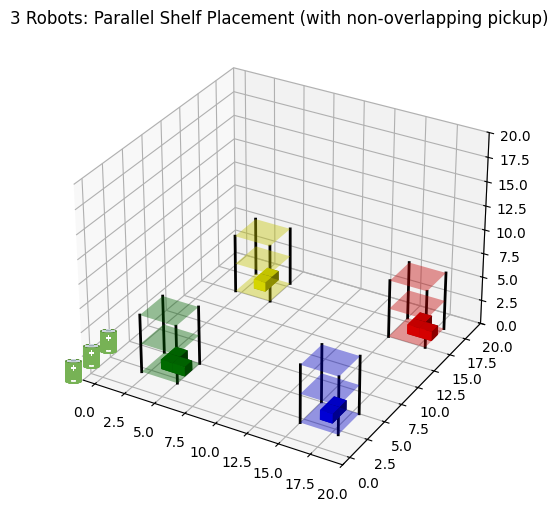

✅ All robots finished, delivered all boxes, and returned to charging!


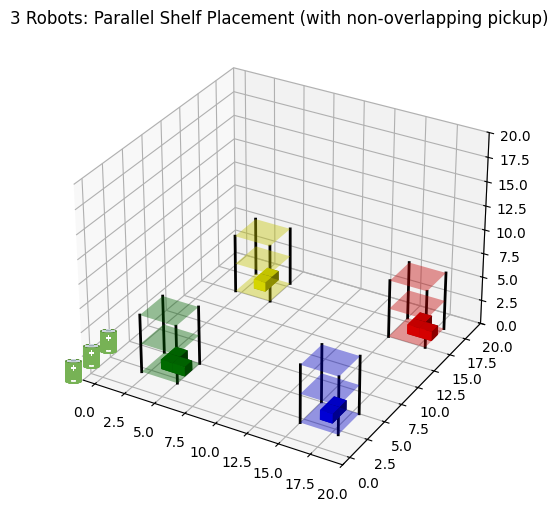

In [ ]:
# --- Download emojis ---
urllib.request.urlretrieve("https://github.com/twitter/twemoji/raw/master/assets/72x72/1f916.png", "robot.png")
urllib.request.urlretrieve("https://github.com/twitter/twemoji/raw/master/assets/72x72/1f50b.png", "charge.png")

robot_img = mpimg.imread("robot.png")
charge_img = mpimg.imread("charge.png")

# --- Setup plot ---
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d")

def draw_shelf(ax, position, color="gray", width=3, depth=3, height=6, levels=3, alpha=0.4):
    x, y, z = position
    level_gap = height // (levels - 1)
    # Legs
    leg_coords = [(x, y), (x+width, y), (x, y+depth), (x+width, y+depth)]
    for lx, ly in leg_coords:
        ax.plot([lx, lx], [ly, ly], [z, z+height], color="black", linewidth=2)
    # Plates
    for i in range(levels):
        z_level = z + i * level_gap
        X, Y = np.meshgrid([0, width], [0, depth])
        ax.plot_surface(X+x, Y+y, np.full_like(X, z_level), color=color, alpha=alpha)

def add_image_marker(ax, x, y, z, img, zoom=0.15):
    x2, y2, _ = proj3d.proj_transform(x, y, z, ax.get_proj())
    im = OffsetImage(img, zoom=zoom)
    ab = AnnotationBbox(im, (x2, y2), frameon=False)
    ax.add_artist(ab)

# --- A* Pathfinding ---
def get_neighbors(pos, size):
    x,y,z = pos
    for dx,dy,dz in [(1,0,0),(-1,0,0),(0,1,0),(0,-1,0)]:
        new=(x+dx,y+dy,z+dz)
        if all(0<=c<size for c in new):
            yield new

def astar(start,goal,size):
    open_set=[]; heappush(open_set,(0,start))
    came_from,g,f={}, {start:0}, {start:math.dist(start,goal)}
    while open_set:
        _,current=heappop(open_set)
        if current==goal:
            path=[]
            while current in came_from:
                path.append(current)
                current=came_from[current]
            return path[::-1]
        for n in get_neighbors(current,size):
            tg=g[current]+1
            if tg<g.get(n,float("inf")):
                came_from[n]=current; g[n]=tg; f[n]=tg+math.dist(n,goal)
                heappush(open_set,(f[n],n))
    return []

# --- Setup ---
room_size=20
robot_starts=[(0,1,0),(0,3,0),(0,5,0)]  # 3 robots
shelves={"red":(15,15,0),"blue":(15,2,0),"yellow":(2,15,0),"green":(2,2,0)}
colors=["red","blue","yellow","green"]

# spawn boxes
box_positions=[]; box_colors=[]
for i in range(12):
    c=random.choice(colors)
    pos=[random.randint(6,12),random.randint(6,12),0]
    box_positions.append(pos); box_colors.append(c)

# delivered states
delivered_boxes=[]
occupied_slots=set()

# --- Shelf slots ---
shelf_slots={c:[] for c in colors}
for c,pos in shelves.items():
    x,y,z=pos
    for level in range(3):
        for dx in range(2):
            for dy in range(2):
                shelf_slots[c].append((x+1+dx, y+1+dy, z+2*level))

# --- Update Plot ---
def update_plot(robot_positions, carrying):
    ax.clear()
    # Shelves
    for c,p in shelves.items():
        draw_shelf(ax,p,color=c,width=3,depth=3,height=6,levels=3,alpha=0.4)
    # Undelivered boxes
    for i,pos in enumerate(box_positions):
        if i not in delivered_boxes and i not in carrying.values():
            ax.bar3d(pos[0],pos[1],pos[2],1,1,1,color=box_colors[i])
    # Delivered boxes
    for slot,color in occupied_slots:
        sx,sy,sz=slot
        ax.bar3d(sx,sy,sz,1,1,1,color=color)
    # Robots + carried
    for r,robot_pos in enumerate(robot_positions):
        add_image_marker(ax,*robot_pos,robot_img,zoom=0.15)
        if r in carrying:
            i=carrying[r]
            # offset carried box UP by +1 in z so it doesn’t overlap robot
            ax.bar3d(robot_pos[0],robot_pos[1],robot_pos[2]+1,1,1,1,color=box_colors[i])
    # Chargers
    for start in robot_starts:
        add_image_marker(ax,*start,charge_img,zoom=0.25)
    ax.set_xlim(-1,room_size); ax.set_ylim(-1,room_size); ax.set_zlim(0,room_size)
    ax.set_title("3 Robots: Parallel Shelf Placement (with non-overlapping pickup)")
    fig.canvas.draw_idle()

# --- Simulation ---
def run_simulation():
    robot_positions=[list(start) for start in robot_starts]
    robot_targets={r:None for r in range(len(robot_positions))}
    robot_paths={r:[] for r in range(len(robot_positions))}
    carrying={}
    tasks=list(range(len(box_positions)))
    assignments={r:tasks[r::len(robot_positions)] for r in range(len(robot_positions))}

    while tasks or any(robot_paths.values()) or carrying:
        for r in range(len(robot_positions)):
            if not robot_paths[r] and r not in carrying:
                if assignments[r]:
                    box_idx=assignments[r].pop(0)
                    robot_targets[r]=("box",box_idx)
                    robot_paths[r]=astar(tuple(robot_positions[r]),tuple(box_positions[box_idx]),room_size)
                elif robot_positions[r]!=list(robot_starts[r]):
                    robot_paths[r]=astar(tuple(robot_positions[r]),robot_starts[r],room_size)

            if robot_paths[r]:
                robot_positions[r]=list(robot_paths[r].pop(0))

            if robot_targets[r] and robot_targets[r][0]=="box":
                box_idx=robot_targets[r][1]
                if tuple(robot_positions[r])==tuple(box_positions[box_idx]):
                    carrying[r]=box_idx
                    color=box_colors[box_idx]
                    for slot in shelf_slots[color]:
                        if (slot,color) not in occupied_slots:
                            robot_targets[r]=("shelf",box_idx,slot)
                            robot_paths[r]=astar(tuple(robot_positions[r]),slot,room_size)
                            break

            if robot_targets[r] and robot_targets[r][0]=="shelf":
                box_idx,slot=robot_targets[r][1],robot_targets[r][2]
                if tuple(robot_positions[r])==slot:
                    color=box_colors[box_idx]
                    delivered_boxes.append(box_idx)
                    occupied_slots.add((slot,color))
                    carrying.pop(r)
                    robot_targets[r]=None
                    print(f"🤖 Robot{r+1} delivered {color} box into shelf slot {slot}.")

        clear_output(wait=True)
        update_plot(robot_positions,carrying)
        display(fig)
        time.sleep(0.1)

        # --- STOP condition: all boxes delivered AND all robots at charging ---
        if len(delivered_boxes)==len(box_positions) and all(tuple(robot_positions[r])==robot_starts[r] for r in range(len(robot_positions))):
            break

    print("✅ All robots finished, delivered all boxes, and returned to charging!")

# Run
run_simulation()


## Obstacle-Aware Truck Loading and Unloading Simulation

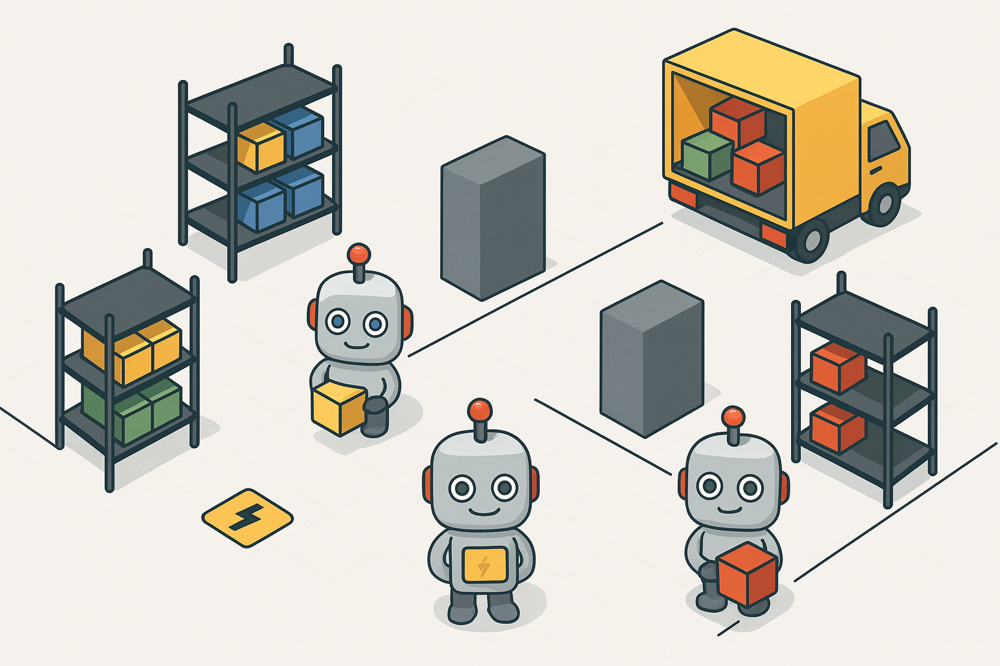

### Importing Required Libraries and Modules

This Python code sets up the necessary libraries and modules required for creating a 3D animated warehouse robot simulation. It imports tools for timing (time), randomization (random), downloading emoji images (urllib.request), and visualization using Matplotlib for 3D plotting. The code also uses IPython.display for smooth animation updates, AnnotationBbox and OffsetImage for placing emoji icons like robots and trucks in the 3D plot, and NumPy for numerical operations and coordinate handling. Together, these imports provide the foundation for building and animating a realistic warehouse environment where robots, shelves, and trucks can be visualized dynamically.

In [ ]:
import time, random, urllib.request
import matplotlib.pyplot as plt
from IPython.display import clear_output, display
from mpl_toolkits.mplot3d import proj3d
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import matplotlib.image as mpimg
import numpy as np


In [ ]:
# --- Download emojis ---
urllib.request.urlretrieve("https://github.com/twitter/twemoji/raw/master/assets/72x72/1f916.png", "robot.png")
urllib.request.urlretrieve("https://github.com/twitter/twemoji/raw/master/assets/72x72/1f69a.png", "truck.png")
urllib.request.urlretrieve("https://github.com/twitter/twemoji/raw/master/assets/72x72/1f50b.png", "charge.png")

robot_img = mpimg.imread("robot.png")
truck_img = np.fliplr(mpimg.imread("truck.png"))
charge_img = mpimg.imread("charge.png")

## Loading scenario

This Python code simulates a warehouse where multiple robots load colored cubes from shelves into a truck using 3D animation. It uses Matplotlib to draw the environment, including shelves, cubes, robots, and the truck, with emoji icons representing each element for better visualization. The warehouse layout includes different colored shelves, a fixed truck at one corner, and three robots that start near charging stations.

During the simulation, each robot moves to its assigned shelf, picks up a cube, and carries it to the truck’s rear side for loading. The cubes disappear once they’re placed, indicating successful delivery inside the truck. After all cubes are loaded, the robots automatically return to their starting positions, representing charging stations, completing their mission.

Overall, the program demonstrates how multiple autonomous robots can coordinate efficiently to complete a loading task. It shows realistic robot motion, task distribution, and teamwork — key principles in modern automated warehouses and logistics systems.

Mission complete — Robots loaded from rear and returned to base!


/usr/local/lib/python3.12/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 129302 (\N{ROBOT FACE}) missing from font(s) DejaVu Sans.
  func(*args, **kwargs)


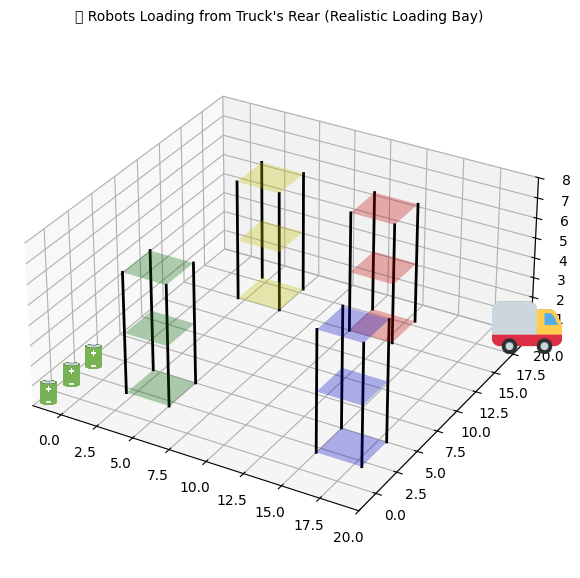

In [ ]:
# --- Setup plot ---
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection="3d")

def draw_shelf(ax, position, color="gray", width=3, depth=3, height=6, levels=3, alpha=0.4):
    x, y, z = position
    level_gap = height // (levels - 1)
    for lx, ly in [(x, y), (x+width, y), (x, y+depth), (x+width, y+depth)]:
        ax.plot([lx, lx], [ly, ly], [z, z+height], color="black", linewidth=2)
    for i in range(levels):
        z_level = z + i * level_gap
        X, Y = np.meshgrid([0, width], [0, depth])
        ax.plot_surface(X+x, Y+y, np.full_like(X, z_level), color=color, alpha=alpha)

def add_image_marker(ax, x, y, z, img, zoom=0.15):
    x2, y2, _ = proj3d.proj_transform(x, y, z, ax.get_proj())
    ab = AnnotationBbox(OffsetImage(img, zoom=zoom), (x2, y2), frameon=False)
    ax.add_artist(ab)

# --- Scene setup ---
room_size = 20
robot_starts = [(1, 2, 0), (1, 4, 0), (1, 6, 0)]
truck_pos = (room_size - 1, room_size - 1, 0.5)
charging_pos = (0, 0, 0)

shelves = {
    "red": (10, 15, 0),
    "blue": (15, 2, 0),
    "yellow": (2, 15, 0),
    "green": (2, 2, 0)
}

# --- Fill shelves with cubes ---
shelf_slots = {c: [] for c in shelves}
for c, pos in shelves.items():
    x, y, z = pos
    for level in range(2):
        z_level = z + level * 3 + 0.2
        for dx in range(2):
            for dy in range(2):
                shelf_slots[c].append((x + 0.8 + dx, y + 0.8 + dy, z_level))

# --- Truck loading area (BEHIND truck) ---
truck_loading_zone = (truck_pos[0] - 1.5, truck_pos[1] - 4, 0.5)

# --- Draw scene ---
def draw_scene(robot_positions, carrying, vanished):
    ax.clear()
    # Draw shelves
    for c, p in shelves.items():
        draw_shelf(ax, p, color=c, width=3, depth=3, height=6, levels=3, alpha=0.3)

    # Draw remaining cubes on shelves
    for color, slots in shelf_slots.items():
        for i, slot in enumerate(slots):
            if (color, i) not in vanished:
                sx, sy, sz = slot
                ax.bar3d(sx, sy, sz, 1, 1, 1, color=color, edgecolor='black', alpha=0.9)

    # Draw robots
    for i, pos in enumerate(robot_positions):
        add_image_marker(ax, *pos, robot_img, zoom=0.15)
        if i in carrying:
            cube_color = carrying[i]
            ax.bar3d(pos[0], pos[1], pos[2]+1, 1, 1, 1, color=cube_color, alpha=0.9)

    # Draw truck (fixed)
    add_image_marker(ax, *truck_pos, truck_img, zoom=0.7)

    # Charging stations
    for start in robot_starts:
        add_image_marker(ax, *start, charge_img, zoom=0.25)

    ax.set_xlim(-2, room_size)
    ax.set_ylim(-2, room_size)
    ax.set_zlim(0, 8)
    ax.set_box_aspect([1, 1, 0.5])
    ax.set_title("🤖 Robots Loading from Truck's Rear (Realistic Loading Bay)", fontsize=10)
    fig.canvas.draw_idle()
    display(fig)

# --- Simulation ---
def run_simulation():
    robot_positions = [list(start) for start in robot_starts]
    carrying = {}
    vanished = set()

    # Distribute tasks
    all_cubes = [(c, i, slot) for c, slots in shelf_slots.items() for i, slot in enumerate(slots)]
    random.shuffle(all_cubes)
    robot_tasks = {r: [] for r in range(3)}
    for i, cube in enumerate(all_cubes):
        robot_tasks[i % 3].append(cube)

    steps = 15
    delay = 0.0

    max_tasks = max(len(v) for v in robot_tasks.values())
    for round_idx in range(max_tasks):
        active_robots = [r for r in range(3) if round_idx < len(robot_tasks[r])]
        current_targets = {r: robot_tasks[r][round_idx] for r in active_robots}

        # --- Move to shelf ---
        for t in np.linspace(0, 1, steps):
            for r in active_robots:
                _, _, (sx, sy, sz) = current_targets[r]
                start = robot_positions[r]
                robot_positions[r] = [
                    start[0] + (sx - start[0]) * t,
                    start[1] + (sy - start[1]) * t,
                    0
                ]
            draw_scene(robot_positions, carrying, vanished)
            time.sleep(delay)
            clear_output(wait=True)

        # --- Pick cube ---
        for r in active_robots:
            color, idx, _ = current_targets[r]
            carrying[r] = color
            vanished.add((color, idx))

        # --- Move to truck's rear side ---
        for t in np.linspace(0, 1, steps):
            for r in active_robots:
                color, idx, (sx, sy, sz) = current_targets[r]
                tx, ty, tz = truck_loading_zone  # not truck front
                robot_positions[r] = [
                    sx + (tx - sx) * t,
                    sy + (ty - sy) * t,
                    0
                ]
            draw_scene(robot_positions, carrying, vanished)
            time.sleep(delay)
            clear_output(wait=True)

        # --- Drop cube inside truck (disappear) ---
        for r in active_robots:
            carrying.pop(r, None)

    print("✅ All cubes loaded through the back of the truck!")
    print("🔋 Robots returning to charging stations...")

    # --- Return to charging ---
    for t in np.linspace(0, 1, 25):
        for r in range(3):
            sx, sy, sz = robot_positions[r]
            cx, cy, cz = robot_starts[r]
            robot_positions[r] = [
                sx + (cx - sx) * t,
                sy + (cy - sy) * t,
                0
            ]
        draw_scene(robot_positions, carrying, vanished)
        time.sleep(delay)
        clear_output(wait=True)

    print("Mission complete — Robots loaded from rear and returned to base!")

# --- Run simulation ---
run_simulation()


## Unloading scenario
This Python program simulates warehouse robots unloading colored cubes from inside a truck and placing them back onto shelves using a 3D animation built with Matplotlib. The environment includes four shelves of different colors, a truck placed at the corner of the room, and three robots that start from charging stations. Emoji images (🤖 robot, 🚛 truck, 🔋 charger) are used to make the visualization interactive and realistic. Each shelf has multiple cube slots, and the truck starts with a mix of colored cubes inside it.

The simulation begins with all robots moving together toward the truck’s interior to start unloading. Each robot picks a cube that matches its assigned color (red, blue, or yellow) from the truck and travels to the correct shelf to place it. The cubes are represented as 3D bars that disappear from the truck and appear on shelves as unloading progresses. This creates a smooth and realistic motion effect where multiple robots work simultaneously to transfer items from the truck to their designated shelves.

Once all the cubes inside the truck are unloaded, the robots return to their original charging positions. The animation clearly shows the workflow — loading, moving, unloading, and returning — highlighting coordination, task division, and automation among multiple robots. Overall, the simulation effectively demonstrates how intelligent warehouse robots can handle truck unloading operations efficiently before returning to charge for their next mission.

Unloading finished and robots returned to charge!


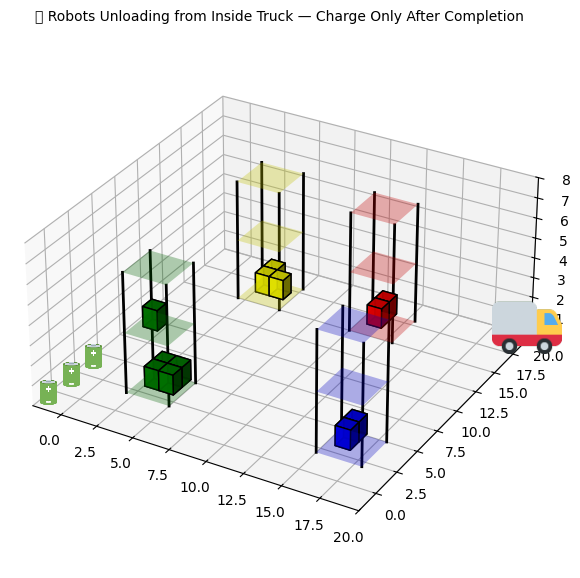

In [ ]:
# --- Setup scene ---
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection="3d")

def draw_shelf(ax, position, color="gray", width=3, depth=3, height=6, levels=3, alpha=0.4):
    x, y, z = position
    level_gap = height // (levels - 1)
    for lx, ly in [(x, y), (x+width, y), (x, y+depth), (x+width, y+depth)]:
        ax.plot([lx, lx], [ly, ly], [z, z+height], color="black", linewidth=2)
    for i in range(levels):
        z_level = z + i * level_gap
        X, Y = np.meshgrid([0, width], [0, depth])
        ax.plot_surface(X+x, Y+y, np.full_like(X, z_level), color=color, alpha=alpha)

def add_image_marker(ax, x, y, z, img, zoom=0.15):
    x2, y2, _ = proj3d.proj_transform(x, y, z, ax.get_proj())
    ab = AnnotationBbox(OffsetImage(img, zoom=zoom), (x2, y2), frameon=False)
    ax.add_artist(ab)

# --- Scene setup ---
room_size = 20
robot_starts = [(1, 2, 0), (1, 4, 0), (1, 6, 0)]
truck_pos = (room_size - 1, room_size - 1, 0.5)
truck_inside_zone = (truck_pos[0] - 1.0, truck_pos[1] - 2.0, 0.5)  # inside truck
charging_pos = (0, 0, 0)

shelves = {
    "red": (10, 15, 0),
    "blue": (15, 2, 0),
    "yellow": (2, 15, 0),
    "green": (2, 2, 0)
}
colors = list(shelves.keys())

# --- Shelf slots ---
shelf_slots = {c: [] for c in shelves}
for c, pos in shelves.items():
    x, y, z = pos
    for level in range(2):
        z_level = z + level * 3 + 0.2
        for dx in range(2):
            for dy in range(2):
                shelf_slots[c].append((x + 0.8 + dx, y + 0.8 + dy, z_level))

# --- Truck cubes ---
truck_cubes = [(truck_inside_zone[0] + random.uniform(-0.3, 0.3),
                truck_inside_zone[1] + random.uniform(-0.3, 0.3),
                0.5, random.choice(colors)) for _ in range(12)]

# --- Draw ---
def draw_scene(robot_positions, carrying, remaining_truck, placed_cubes):
    ax.clear()

    for c, p in shelves.items():
        draw_shelf(ax, p, color=c, width=3, depth=3, height=6, levels=3, alpha=0.3)

    for (x, y, z, color) in placed_cubes:
        ax.bar3d(x, y, z, 1, 1, 1, color=color, edgecolor='black', alpha=0.9)

    for i, pos in enumerate(robot_positions):
        add_image_marker(ax, *pos, robot_img, zoom=0.15)
        if i in carrying:
            ax.bar3d(pos[0], pos[1], pos[2]+1, 1, 1, 1, color=carrying[i], alpha=0.9)

    add_image_marker(ax, *truck_pos, truck_img, zoom=0.7)
    for start in robot_starts:
        add_image_marker(ax, *start, charge_img, zoom=0.25)

    ax.set_xlim(-2, room_size)
    ax.set_ylim(-2, room_size)
    ax.set_zlim(0, 8)
    ax.set_box_aspect([1, 1, 0.5])
    ax.set_title("🤖 Robots Unloading from Inside Truck — Charge Only After Completion", fontsize=10)
    fig.canvas.draw_idle()
    display(fig)

# --- Simulation ---
def run_unloading():
    robot_positions = [list(start) for start in robot_starts]
    carrying, placed_cubes = {}, []
    remaining_truck = truck_cubes.copy()
    robot_colors = ["red", "blue", "yellow"]
    shelf_indices = {c: 0 for c in shelf_slots}

    steps, delay = 20, 0.02
    print("🚚 Robots starting unloading (charging only after truck is empty)...")

    # Step 1: Robots go to the truck ONCE at start
    for t in np.linspace(0, 1, steps):
        for r in range(3):
            start = robot_starts[r]
            tx, ty, tz = truck_inside_zone
            robot_positions[r] = [
                start[0] + (tx - start[0]) * t,
                start[1] + (ty - start[1]) * t,
                0
            ]
        draw_scene(robot_positions, carrying, remaining_truck, placed_cubes)
        time.sleep(delay)
        clear_output(wait=True)

    # Step 2: Continuous unloading between truck and shelves
    while remaining_truck:
        active_robots = [r for r in range(3) if remaining_truck]

        # Pick cubes from truck
        for r in active_robots:
            if remaining_truck:
                color = robot_colors[r % len(robot_colors)]
                cube_idx = next((i for i, (_, _, _, c) in enumerate(remaining_truck) if c == color), 0)
                _, _, _, color = remaining_truck.pop(cube_idx)
                carrying[r] = color

        # Move to shelves (parallel)
        for t in np.linspace(0, 1, steps):
            for r in active_robots:
                color = carrying[r]
                idx = shelf_indices[color]
                if idx < len(shelf_slots[color]):
                    sx, sy, sz = shelf_slots[color][idx]
                    tx, ty, tz = truck_inside_zone
                    robot_positions[r] = [
                        tx + (sx - tx) * t,
                        ty + (sy - ty) * t,
                        0
                    ]
            draw_scene(robot_positions, carrying, remaining_truck, placed_cubes)
            time.sleep(delay)
            clear_output(wait=True)

        # Drop cubes on shelf
        for r in active_robots:
            color = carrying[r]
            idx = shelf_indices[color]
            if idx < len(shelf_slots[color]):
                shelf_indices[color] += 1
                sx, sy, sz = shelf_slots[color][idx]
                placed_cubes.append((sx, sy, sz, color))
            carrying.pop(r, None)

        # Move back to truck for next pickup (not charging)
        for t in np.linspace(0, 1, steps):
            for r in active_robots:
                sx, sy, sz = robot_positions[r]
                tx, ty, tz = truck_inside_zone
                robot_positions[r] = [
                    sx + (tx - sx) * t,
                    sy + (ty - sy) * t,
                    0
                ]
            draw_scene(robot_positions, carrying, remaining_truck, placed_cubes)
            time.sleep(delay)
            clear_output(wait=True)

    # Step 3: After all cubes are done, return to charging
    print("🔋 Truck empty! Robots now returning to charging stations...")
    for t in np.linspace(0, 1, steps):
        for r in range(3):
            sx, sy, sz = robot_positions[r]
            cx, cy, cz = robot_starts[r]
            robot_positions[r] = [
                sx + (cx - sx) * t,
                sy + (cy - sy) * t,
                0
            ]
        draw_scene(robot_positions, carrying, remaining_truck, placed_cubes)
        time.sleep(delay)
        clear_output(wait=True)

    print("Unloading finished and robots returned to charge!")

# --- Run ---
run_unloading()


## unloading Adding obstacles

This Python program simulates robots unloading colored cubes from a truck into shelves while avoiding obstacles using 3D animation. It creates a warehouse scene with four colored shelves, three robots, and a fixed truck inside the 3D environment using Matplotlib. The robots start from charging stations, move toward the truck, pick cubes, and place them into their respective colored shelves through smooth, step-based motion.

Each robot follows a path with obstacle avoidance, ensuring they don’t collide with tall gray barriers placed in the room. The function move_with_avoidance() calculates detour paths for smooth navigation. Robots pick cubes of specific colors, carry them, and drop them neatly into unique shelf slots, making the placement realistic and organized.

Once the truck becomes empty, the robots automatically return to their charging stations. The simulation effectively demonstrates autonomous robot coordination, path planning, and warehouse automation, highlighting how multiple robots can work together efficiently even in the presence of obstacles.

All cubes placed neatly inside shelves and robots returned to charge!


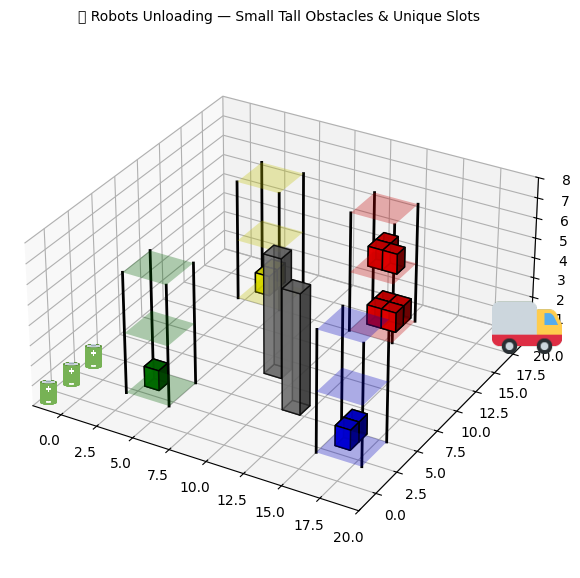

In [ ]:
# --- Setup plot ---
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection="3d")

def draw_shelf(ax, position, color="gray", width=3, depth=3, height=6, levels=3, alpha=0.4):
    x, y, z = position
    level_gap = height // (levels - 1)
    for lx, ly in [(x, y), (x + width, y), (x, y + depth), (x + width, y + depth)]:
        ax.plot([lx, lx], [ly, ly], [z, z + height], color="black", linewidth=2)
    for i in range(levels):
        z_level = z + i * level_gap
        X, Y = np.meshgrid([0, width], [0, depth])
        ax.plot_surface(X + x, Y + y, np.full_like(X, z_level), color=color, alpha=alpha)

def add_image_marker(ax, x, y, z, img, zoom=0.15):
    x2, y2, _ = proj3d.proj_transform(x, y, z, ax.get_proj())
    ab = AnnotationBbox(OffsetImage(img, zoom=zoom), (x2, y2), frameon=False)
    ax.add_artist(ab)

# --- Scene setup ---
room_size = 20
robot_starts = [(1, 2, 0), (1, 4, 0), (1, 6, 0)]
truck_pos = (room_size - 1, room_size - 1, 0.5)
truck_inside_zone = (truck_pos[0] - 1.0, truck_pos[1] - 2.0, 0.5)
charging_pos = (0, 0, 0)

# Smaller but taller gray obstacles
obstacles = [
    (8, 8, 0, 1.2, 1.2, 6),
    (11, 5, 0, 1.2, 1.2, 6)
]

# --- Shelves ---
shelves = {
    "red": (10, 15, 0),
    "blue": (15, 2, 0),
    "yellow": (2, 15, 0),
    "green": (2, 2, 0)
}
colors = list(shelves.keys())

# --- Shelf slots ---
shelf_slots = {c: [] for c in shelves}
for c, pos in shelves.items():
    x, y, z = pos
    for level in range(2):
        z_level = z + level * 3 + 0.2
        for dx in range(2):
            for dy in range(2):
                shelf_slots[c].append((x + 0.8 + dx, y + 0.8 + dy, z_level))

# --- Truck cubes (inside the truck) ---
num_boxes_to_unload = 12
truck_cubes = [
    (
        truck_inside_zone[0] + random.uniform(-0.3, 0.3),
        truck_inside_zone[1] + random.uniform(-0.3, 0.3),
        0.5,
        random.choice(colors),
    )
    for _ in range(num_boxes_to_unload)
]

# --- Path planning with obstacle avoidance ---
def move_with_avoidance(start, end, steps=20):
    path = []
    sx, sy, _ = start
    ex, ey, _ = end
    mid_x, mid_y = (sx + ex) / 2, (sy + ey) / 2
    for (ox, oy, _, ow, od, _) in obstacles:
        if (min(sx, ex) < ox + ow and max(sx, ex) > ox) and (min(sy, ey) < oy + od and max(sy, ey) > oy):
            mid_y += 3
    for t in np.linspace(0, 1, steps):
        if t < 0.5:
            x = sx + (mid_x - sx) * (t * 2)
            y = sy + (mid_y - sy) * (t * 2)
        else:
            x = mid_x + (ex - mid_x) * ((t - 0.5) * 2)
            y = mid_y + (ey - mid_y) * ((t - 0.5) * 2)
        path.append((x, y, 0))
    return path

# --- Draw everything ---
def draw_scene(robot_positions, carrying, remaining_truck, placed_cubes):
    ax.clear()

    # Draw shelves
    for c, p in shelves.items():
        draw_shelf(ax, p, color=c, width=3, depth=3, height=6, levels=3, alpha=0.3)

    # Draw smaller, taller obstacles
    for (x, y, z, w, d, h) in obstacles:
        ax.bar3d(x, y, z, w, d, h, color="gray", alpha=0.7, edgecolor="black")

    # Placed cubes
    for (x, y, z, color) in placed_cubes:
        ax.bar3d(x, y, z, 1, 1, 1, color=color, edgecolor="black", alpha=0.9)

    # Robots
    for i, pos in enumerate(robot_positions):
        add_image_marker(ax, *pos, robot_img, zoom=0.15)
        if i in carrying:
            ax.bar3d(pos[0], pos[1], pos[2] + 1, 1, 1, 1, color=carrying[i], alpha=0.9)

    # Truck & charging icons
    add_image_marker(ax, *truck_pos, truck_img, zoom=0.7)
    for start in robot_starts:
        add_image_marker(ax, *start, charge_img, zoom=0.25)

    # Display
    ax.set_xlim(-2, room_size)
    ax.set_ylim(-2, room_size)
    ax.set_zlim(0, 8)
    ax.set_box_aspect([1, 1, 0.5])
    ax.set_title("🤖 Robots Unloading — Small Tall Obstacles & Unique Slots", fontsize=10)
    fig.canvas.draw_idle()
    display(fig)

# --- Simulation ---
def run_unloading():
    robot_positions = [list(start) for start in robot_starts]
    carrying, placed_cubes, robot_targets = {}, [], {}
    remaining_truck = truck_cubes.copy()
    robot_colors = ["red", "blue", "yellow"]
    shelf_indices = {c: 0 for c in shelf_slots}
    steps, delay = 20, 0.02

    print("🚚 Robots unloading from truck with unique slots and tall gray obstacles...")

    # Robots go to truck once at start
    paths_to_truck = [move_with_avoidance(robot_starts[r], truck_inside_zone, steps) for r in range(3)]
    for t in range(steps):
        for r in range(3):
            robot_positions[r] = paths_to_truck[r][t]
        draw_scene(robot_positions, carrying, remaining_truck, placed_cubes)
        time.sleep(delay)
        clear_output(wait=True)

    # Continuous unloading
    while remaining_truck:
        active_robots = [r for r in range(3) if remaining_truck]

        # Each robot picks a cube and reserves unique shelf slot
        for r in active_robots:
            if remaining_truck:
                color = robot_colors[r % len(robot_colors)]
                cube_idx = next((i for i, (_, _, _, c) in enumerate(remaining_truck) if c == color), 0)
                _, _, _, color = remaining_truck.pop(cube_idx)
                carrying[r] = color

                # Reserve slot immediately (unique placement)
                idx = shelf_indices[color]
                shelf_indices[color] += 1
                target_slot = shelf_slots[color][idx] if idx < len(shelf_slots[color]) else (shelves[color][0], shelves[color][1], 0.5)
                robot_targets[r] = target_slot

        # Move robots toward their shelves (avoid obstacles)
        for t in range(steps):
            for r in active_robots:
                sx, sy, sz = robot_positions[r]
                tx, ty, tz = robot_targets[r]
                # Stop slightly before the shelf (outside)
                stop_y = ty - 0.5 if ty > truck_inside_zone[1] else ty + 0.5
                px, py, pz = (sx + (tx - sx) * (t / steps), sy + (stop_y - sy) * (t / steps), 0)
                robot_positions[r] = (px, py, pz)
            draw_scene(robot_positions, carrying, remaining_truck, placed_cubes)
            time.sleep(delay)
            clear_output(wait=True)

        # Drop cubes inside shelf
        for r in active_robots:
            color = carrying[r]
            tx, ty, tz = robot_targets[r]
            placed_cubes.append((tx, ty, tz, color))
            carrying.pop(r, None)

        # Return to truck for next cube
        back_paths = [move_with_avoidance(robot_positions[r], truck_inside_zone, steps) for r in active_robots]
        for t in range(steps):
            for r in active_robots:
                robot_positions[r] = back_paths[r][t]
            draw_scene(robot_positions, carrying, remaining_truck, placed_cubes)
            time.sleep(delay)
            clear_output(wait=True)

    # After unloading complete → return to charge
    print("🔋 Truck empty! Robots returning to charging stations...")
    back_to_charge = [move_with_avoidance(robot_positions[r], robot_starts[r], steps) for r in range(3)]
    for t in range(steps):
        for r in range(3):
            robot_positions[r] = back_to_charge[r][t]
        draw_scene(robot_positions, carrying, remaining_truck, placed_cubes)
        time.sleep(delay)
        clear_output(wait=True)

    print("All cubes placed neatly inside shelves and robots returned to charge!")

# --- Run simulation ---
run_unloading()


## loading adding obstacle

This Python program simulates robots loading a truck while avoiding obstacles using 3D animation with Matplotlib. The warehouse scene includes multiple colored shelves containing cubes, a truck placed at the far corner, and three robots that start from charging stations. Small, slightly tall gray obstacles are added between the shelves and the truck to make navigation more realistic and challenging.

Each robot is assigned specific cubes to pick up from the shelves. The function move_with_avoidance() plans smooth movement paths that include detours around obstacles, ensuring robots don’t collide during operation. Robots move from their starting positions to the shelves, pick up colored cubes, and transport them to the rear side of the truck for loading. Once the cube is dropped off, the robot proceeds to its next assigned task.

After all cubes are successfully loaded into the truck, the robots automatically return to their charging stations, again following paths that avoid obstacles. The animation visually demonstrates how multiple robots can coordinate, plan safe routes, and complete logistics operations efficiently. Overall, this simulation represents a realistic obstacle-aware robotic loading system for warehouse automation.

Mission complete — Robots loaded truck safely avoiding obstacles!


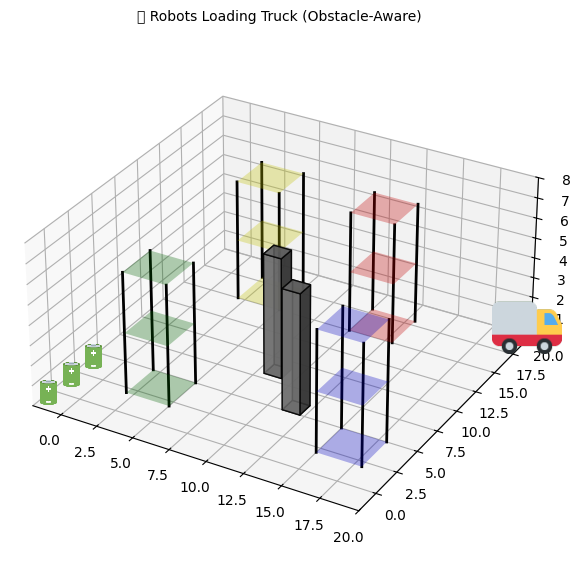

In [ ]:
# --- Setup plot ---
fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection="3d")

def draw_shelf(ax, position, color="gray", width=3, depth=3, height=6, levels=3, alpha=0.4):
    x, y, z = position
    level_gap = height // (levels - 1)
    for lx, ly in [(x, y), (x+width, y), (x, y+depth), (x+width, y+depth)]:
        ax.plot([lx, lx], [ly, ly], [z, z+height], color="black", linewidth=2)
    for i in range(levels):
        z_level = z + i * level_gap
        X, Y = np.meshgrid([0, width], [0, depth])
        ax.plot_surface(X+x, Y+y, np.full_like(X, z_level), color=color, alpha=alpha)

def add_image_marker(ax, x, y, z, img, zoom=0.15):
    x2, y2, _ = proj3d.proj_transform(x, y, z, ax.get_proj())
    ab = AnnotationBbox(OffsetImage(img, zoom=zoom), (x2, y2), frameon=False)
    ax.add_artist(ab)

# --- Scene setup ---
room_size = 20
robot_starts = [(1, 2, 0), (1, 4, 0), (1, 6, 0)]
truck_pos = (room_size - 1, room_size - 1, 0.5)
charging_pos = (0, 0, 0)

# --- Add obstacles (small + slightly tall) ---
obstacles = [
    (8, 8, 0, 1.2, 1.2, 6),
    (11, 5, 0, 1.2, 1.2, 6)
]

# --- Path planning (simple obstacle avoidance) ---
def move_with_avoidance(start, end, steps=15):
    path = []
    sx, sy, _ = start
    ex, ey, _ = end
    mid_x, mid_y = (sx + ex) / 2, (sy + ey) / 2

    for (ox, oy, _, ow, od, _) in obstacles:
        # check if obstacle lies between start and end
        if (min(sx, ex) < ox + ow and max(sx, ex) > ox) and (min(sy, ey) < oy + od and max(sy, ey) > oy):
            mid_y += 3  # small upward detour
    for t in np.linspace(0, 1, steps):
        if t < 0.5:
            x = sx + (mid_x - sx) * (t * 2)
            y = sy + (mid_y - sy) * (t * 2)
        else:
            x = mid_x + (ex - mid_x) * ((t - 0.5) * 2)
            y = mid_y + (ey - mid_y) * ((t - 0.5) * 2)
        path.append((x, y, 0))
    return path

shelves = {
    "red": (10, 15, 0),
    "blue": (15, 2, 0),
    "yellow": (2, 15, 0),
    "green": (2, 2, 0)
}

# --- Fill shelves with cubes ---
shelf_slots = {c: [] for c in shelves}
for c, pos in shelves.items():
    x, y, z = pos
    for level in range(2):
        z_level = z + level * 3 + 0.2
        for dx in range(2):
            for dy in range(2):
                shelf_slots[c].append((x + 0.8 + dx, y + 0.8 + dy, z_level))

# --- Truck loading area (rear of truck) ---
truck_loading_zone = (truck_pos[0] - 1.5, truck_pos[1] - 4, 0.5)

# --- Draw scene ---
def draw_scene(robot_positions, carrying, vanished):
    ax.clear()

    # Draw shelves
    for c, p in shelves.items():
        draw_shelf(ax, p, color=c, width=3, depth=3, height=6, levels=3, alpha=0.3)

    # Draw obstacles
    for (x, y, z, w, d, h) in obstacles:
        ax.bar3d(x, y, z, w, d, h, color="gray", alpha=0.8, edgecolor="black")

    # Draw remaining cubes
    for color, slots in shelf_slots.items():
        for i, slot in enumerate(slots):
            if (color, i) not in vanished:
                sx, sy, sz = slot
                ax.bar3d(sx, sy, sz, 1, 1, 1, color=color, edgecolor='black', alpha=0.9)

    # Robots
    for i, pos in enumerate(robot_positions):
        add_image_marker(ax, *pos, robot_img, zoom=0.15)
        if i in carrying:
            cube_color = carrying[i]
            ax.bar3d(pos[0], pos[1], pos[2]+1, 1, 1, 1, color=cube_color, alpha=0.9)

    # Truck + Charging
    add_image_marker(ax, *truck_pos, truck_img, zoom=0.7)
    for start in robot_starts:
        add_image_marker(ax, *start, charge_img, zoom=0.25)

    ax.set_xlim(-2, room_size)
    ax.set_ylim(-2, room_size)
    ax.set_zlim(0, 8)
    ax.set_box_aspect([1, 1, 0.5])
    ax.set_title("🤖 Robots Loading Truck (Obstacle-Aware)", fontsize=10)
    fig.canvas.draw_idle()
    display(fig)

# --- Simulation ---
def run_simulation():
    robot_positions = [list(start) for start in robot_starts]
    carrying, vanished = {}, set()

    all_cubes = [(c, i, slot) for c, slots in shelf_slots.items() for i, slot in enumerate(slots)]
    random.shuffle(all_cubes)
    robot_tasks = {r: [] for r in range(3)}
    for i, cube in enumerate(all_cubes):
        robot_tasks[i % 3].append(cube)

    steps, delay = 15, 0.02
    max_tasks = max(len(v) for v in robot_tasks.values())

    print("🚚 Robots loading truck while avoiding obstacles...")

    for round_idx in range(max_tasks):
        active_robots = [r for r in range(3) if round_idx < len(robot_tasks[r])]
        current_targets = {r: robot_tasks[r][round_idx] for r in active_robots}

        # --- Move to shelf (avoid obstacles) ---
        for t in range(steps):
            for r in active_robots:
                _, _, (sx, sy, sz) = current_targets[r]
                path = move_with_avoidance(robot_positions[r], (sx, sy, 0), steps)
                robot_positions[r] = path[t]
            draw_scene(robot_positions, carrying, vanished)
            time.sleep(delay)
            clear_output(wait=True)

        # --- Pick cube ---
        for r in active_robots:
            color, idx, _ = current_targets[r]
            carrying[r] = color
            vanished.add((color, idx))

        # --- Move to truck's rear side (avoid obstacles) ---
        for t in range(steps):
            for r in active_robots:
                color, idx, (sx, sy, sz) = current_targets[r]
                path = move_with_avoidance(robot_positions[r], truck_loading_zone, steps)
                robot_positions[r] = path[t]
            draw_scene(robot_positions, carrying, vanished)
            time.sleep(delay)
            clear_output(wait=True)

        # --- Drop cube inside truck ---
        for r in active_robots:
            carrying.pop(r, None)

    print("All cubes loaded through back of truck (obstacle-aware)!")
    print("Robots returning to charge...")

    # --- Return to charging ---
    for t in range(25):
        for r in range(3):
            path = move_with_avoidance(robot_positions[r], robot_starts[r], 25)
            robot_positions[r] = path[t]
        draw_scene(robot_positions, carrying, vanished)
        time.sleep(delay)
        clear_output(wait=True)

    print("Mission complete — Robots loaded truck safely avoiding obstacles!")

# --- Run ---
run_simulation()


## Conclusion

This project successfully demonstrates a complete warehouse automation system using Python and Matplotlib, where robots intelligently navigate, pick up, and place boxes in designated shelves while avoiding obstacles and returning to charge. Through multiple simulation stages — single-robot operations, multi-robot coordination, obstacle-aware navigation, and loading/unloading of a truck — the project showcases how A* pathfinding enables efficient movement and decision-making in dynamic environments.

The visual 3D animations make the process both interactive and educational, providing clear insight into how real-world autonomous warehouse robots function in logistics, manufacturing, and supply chain management. By simulating charging behavior, obstacle avoidance, and teamwork, the project highlights the potential of AI-driven robotics in improving speed, accuracy, and safety in automated warehouse operations. Overall, it demonstrates a strong foundation for future advancements in multi-agent robotics, smart warehouses, and industrial automation.

